# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [14]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

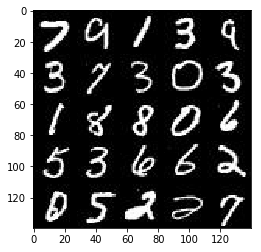

In [15]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

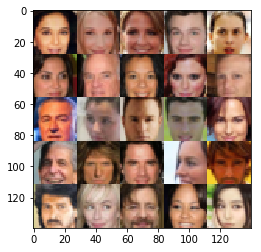

In [16]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [17]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [18]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, shape=(None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32)
    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [19]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha=0.01

    with tf.variable_scope('discriminator', reuse=reuse) as discriminator:
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)

        x2 = tf.layers.conv2d(relu1, 64, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)

        x3 = tf.layers.conv2d(relu2, 32, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)

        flat = tf.reshape(relu3, (-1, 4*4*32))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [27]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.01
    reuse = True if not is_train else False

    with tf.variable_scope('generator', reuse=reuse) as generator:
        # First fully connected layer
        x1 = tf.layers.dense(z, 3*3*512)

        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 3, 3, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)

        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)

        x3 = tf.image.resize_nearest_neighbor(x2, (7,7))
        x3 = tf.layers.conv2d_transpose(x3, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)

        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        out = tf.tanh(logits)
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [28]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [29]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [30]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [33]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    image_depth = 1 if data_image_mode == 'L' else 3
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], image_depth, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_depth)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    steps = 0
    n_images = show_n_images
    print_every = 10
    show_every = 100    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model                
                batch_images = 2 * batch_images
                steps += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, lr:learning_rate})

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, n_images, input_z, image_depth, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.5814... Generator Loss: 1.0718
Epoch 1/2... Discriminator Loss: 0.1612... Generator Loss: 2.4906
Epoch 1/2... Discriminator Loss: 0.2640... Generator Loss: 1.6817
Epoch 1/2... Discriminator Loss: 0.4081... Generator Loss: 5.2019
Epoch 1/2... Discriminator Loss: 0.2134... Generator Loss: 2.3276
Epoch 1/2... Discriminator Loss: 0.1126... Generator Loss: 2.5455
Epoch 1/2... Discriminator Loss: 0.4756... Generator Loss: 1.1704
Epoch 1/2... Discriminator Loss: 0.3377... Generator Loss: 2.9934
Epoch 1/2... Discriminator Loss: 0.3102... Generator Loss: 1.5098
Epoch 1/2... Discriminator Loss: 0.2921... Generator Loss: 2.4515


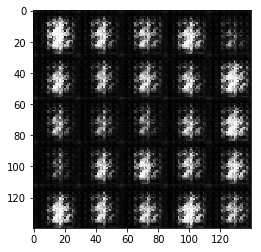

Epoch 1/2... Discriminator Loss: 0.4006... Generator Loss: 1.7438
Epoch 1/2... Discriminator Loss: 0.8768... Generator Loss: 6.4019
Epoch 1/2... Discriminator Loss: 0.5584... Generator Loss: 1.3737
Epoch 1/2... Discriminator Loss: 0.2607... Generator Loss: 2.1365
Epoch 1/2... Discriminator Loss: 0.4531... Generator Loss: 2.3440
Epoch 1/2... Discriminator Loss: 0.2376... Generator Loss: 2.2987
Epoch 1/2... Discriminator Loss: 0.3049... Generator Loss: 3.2369
Epoch 1/2... Discriminator Loss: 0.1886... Generator Loss: 2.7427
Epoch 1/2... Discriminator Loss: 0.1938... Generator Loss: 3.2100
Epoch 1/2... Discriminator Loss: 0.6873... Generator Loss: 0.9686


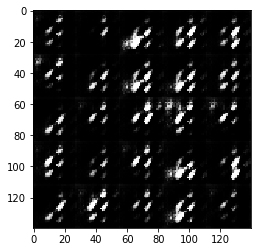

Epoch 1/2... Discriminator Loss: 0.1495... Generator Loss: 2.7993
Epoch 1/2... Discriminator Loss: 0.1838... Generator Loss: 3.7476
Epoch 1/2... Discriminator Loss: 0.1811... Generator Loss: 3.1696
Epoch 1/2... Discriminator Loss: 0.1568... Generator Loss: 3.0591
Epoch 1/2... Discriminator Loss: 0.3771... Generator Loss: 2.3364
Epoch 1/2... Discriminator Loss: 0.3114... Generator Loss: 2.4320
Epoch 1/2... Discriminator Loss: 0.6599... Generator Loss: 4.1228
Epoch 1/2... Discriminator Loss: 0.2589... Generator Loss: 3.2756
Epoch 1/2... Discriminator Loss: 0.9373... Generator Loss: 0.7527
Epoch 1/2... Discriminator Loss: 0.3029... Generator Loss: 2.2929


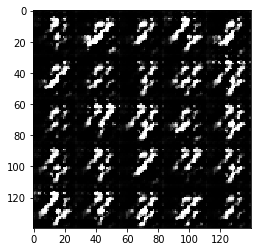

Epoch 1/2... Discriminator Loss: 0.3378... Generator Loss: 1.8639
Epoch 1/2... Discriminator Loss: 0.8207... Generator Loss: 4.5107
Epoch 1/2... Discriminator Loss: 0.5894... Generator Loss: 2.3995
Epoch 1/2... Discriminator Loss: 0.4106... Generator Loss: 1.5902
Epoch 1/2... Discriminator Loss: 0.2814... Generator Loss: 2.4997
Epoch 1/2... Discriminator Loss: 0.1981... Generator Loss: 2.8532
Epoch 1/2... Discriminator Loss: 0.2941... Generator Loss: 2.8693
Epoch 1/2... Discriminator Loss: 0.3821... Generator Loss: 2.0082
Epoch 1/2... Discriminator Loss: 0.2495... Generator Loss: 2.3599
Epoch 1/2... Discriminator Loss: 0.7216... Generator Loss: 1.0410


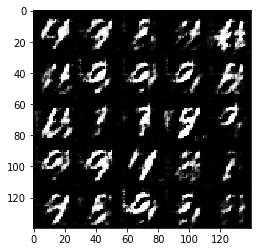

Epoch 1/2... Discriminator Loss: 0.4355... Generator Loss: 1.4521
Epoch 1/2... Discriminator Loss: 1.1837... Generator Loss: 0.6476
Epoch 1/2... Discriminator Loss: 0.9060... Generator Loss: 4.6627
Epoch 1/2... Discriminator Loss: 0.5287... Generator Loss: 1.5678
Epoch 1/2... Discriminator Loss: 0.6785... Generator Loss: 1.3982
Epoch 1/2... Discriminator Loss: 0.3156... Generator Loss: 2.1223
Epoch 1/2... Discriminator Loss: 0.5104... Generator Loss: 1.9563
Epoch 1/2... Discriminator Loss: 0.7082... Generator Loss: 1.3338
Epoch 1/2... Discriminator Loss: 1.0737... Generator Loss: 0.6883
Epoch 1/2... Discriminator Loss: 0.7286... Generator Loss: 3.2144


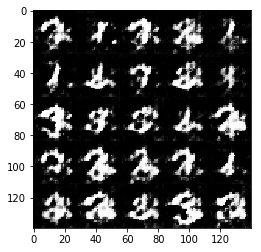

Epoch 1/2... Discriminator Loss: 0.8198... Generator Loss: 1.0170
Epoch 1/2... Discriminator Loss: 1.1526... Generator Loss: 0.5511
Epoch 1/2... Discriminator Loss: 0.8029... Generator Loss: 1.1020
Epoch 1/2... Discriminator Loss: 0.6330... Generator Loss: 1.5599
Epoch 1/2... Discriminator Loss: 0.6666... Generator Loss: 1.4905
Epoch 1/2... Discriminator Loss: 0.9622... Generator Loss: 1.6890
Epoch 1/2... Discriminator Loss: 0.8541... Generator Loss: 1.7444
Epoch 1/2... Discriminator Loss: 0.7356... Generator Loss: 1.1200
Epoch 1/2... Discriminator Loss: 0.7107... Generator Loss: 1.3524
Epoch 1/2... Discriminator Loss: 0.6800... Generator Loss: 1.3153


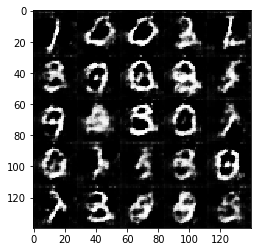

Epoch 1/2... Discriminator Loss: 0.7630... Generator Loss: 1.0614
Epoch 1/2... Discriminator Loss: 1.1636... Generator Loss: 0.7428
Epoch 1/2... Discriminator Loss: 0.4960... Generator Loss: 2.3705
Epoch 1/2... Discriminator Loss: 0.5268... Generator Loss: 1.9581
Epoch 1/2... Discriminator Loss: 1.0038... Generator Loss: 0.6954
Epoch 1/2... Discriminator Loss: 0.6355... Generator Loss: 1.6660
Epoch 1/2... Discriminator Loss: 1.2429... Generator Loss: 0.5199
Epoch 1/2... Discriminator Loss: 0.9278... Generator Loss: 1.2690
Epoch 1/2... Discriminator Loss: 0.9056... Generator Loss: 2.2966
Epoch 1/2... Discriminator Loss: 0.9308... Generator Loss: 0.7871


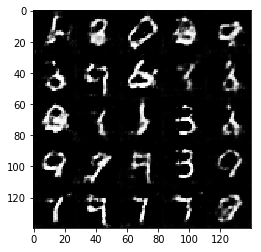

Epoch 1/2... Discriminator Loss: 0.9650... Generator Loss: 0.7453
Epoch 1/2... Discriminator Loss: 0.8528... Generator Loss: 0.9798
Epoch 1/2... Discriminator Loss: 0.6904... Generator Loss: 2.4937
Epoch 1/2... Discriminator Loss: 0.8751... Generator Loss: 1.8191
Epoch 1/2... Discriminator Loss: 0.9763... Generator Loss: 0.7501
Epoch 1/2... Discriminator Loss: 1.0905... Generator Loss: 1.1030
Epoch 1/2... Discriminator Loss: 0.7433... Generator Loss: 1.0691
Epoch 1/2... Discriminator Loss: 1.0447... Generator Loss: 0.7272
Epoch 1/2... Discriminator Loss: 1.0650... Generator Loss: 0.8857
Epoch 1/2... Discriminator Loss: 0.8002... Generator Loss: 1.3257


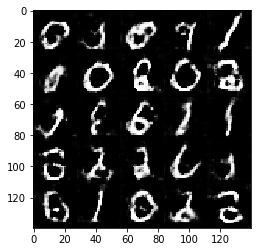

Epoch 1/2... Discriminator Loss: 0.8217... Generator Loss: 1.0832
Epoch 1/2... Discriminator Loss: 0.8105... Generator Loss: 1.0092
Epoch 1/2... Discriminator Loss: 1.0202... Generator Loss: 0.6651
Epoch 1/2... Discriminator Loss: 0.9475... Generator Loss: 0.8665
Epoch 1/2... Discriminator Loss: 0.7529... Generator Loss: 1.7598
Epoch 1/2... Discriminator Loss: 0.9266... Generator Loss: 0.7755
Epoch 1/2... Discriminator Loss: 1.0921... Generator Loss: 3.0540
Epoch 1/2... Discriminator Loss: 1.0273... Generator Loss: 0.7209
Epoch 1/2... Discriminator Loss: 0.9427... Generator Loss: 1.6538
Epoch 1/2... Discriminator Loss: 0.8140... Generator Loss: 0.8960


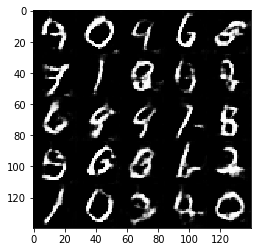

Epoch 1/2... Discriminator Loss: 0.9052... Generator Loss: 1.1699
Epoch 1/2... Discriminator Loss: 1.2204... Generator Loss: 0.5545
Epoch 1/2... Discriminator Loss: 0.8503... Generator Loss: 1.8019
Epoch 1/2... Discriminator Loss: 0.8011... Generator Loss: 1.1521
Epoch 1/2... Discriminator Loss: 1.2065... Generator Loss: 0.5439
Epoch 1/2... Discriminator Loss: 0.9327... Generator Loss: 0.7551
Epoch 1/2... Discriminator Loss: 0.8956... Generator Loss: 1.3148
Epoch 1/2... Discriminator Loss: 0.8990... Generator Loss: 1.1568
Epoch 1/2... Discriminator Loss: 1.0623... Generator Loss: 0.6754
Epoch 1/2... Discriminator Loss: 1.3469... Generator Loss: 0.4805


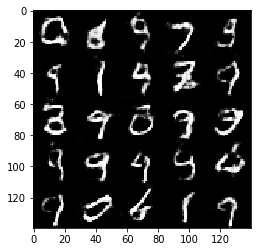

Epoch 1/2... Discriminator Loss: 0.6441... Generator Loss: 1.4752
Epoch 1/2... Discriminator Loss: 0.9564... Generator Loss: 1.4190
Epoch 1/2... Discriminator Loss: 1.2694... Generator Loss: 0.5096
Epoch 1/2... Discriminator Loss: 0.7739... Generator Loss: 1.2396
Epoch 1/2... Discriminator Loss: 0.8965... Generator Loss: 1.2121
Epoch 1/2... Discriminator Loss: 1.0662... Generator Loss: 0.8205
Epoch 1/2... Discriminator Loss: 1.5159... Generator Loss: 0.3603
Epoch 1/2... Discriminator Loss: 0.7334... Generator Loss: 1.3494
Epoch 1/2... Discriminator Loss: 1.6190... Generator Loss: 0.3208
Epoch 1/2... Discriminator Loss: 1.3557... Generator Loss: 2.2244


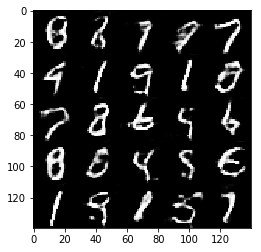

Epoch 1/2... Discriminator Loss: 0.9072... Generator Loss: 1.1200
Epoch 1/2... Discriminator Loss: 1.0374... Generator Loss: 0.6924
Epoch 1/2... Discriminator Loss: 1.0859... Generator Loss: 0.6088
Epoch 1/2... Discriminator Loss: 0.7283... Generator Loss: 1.3313
Epoch 1/2... Discriminator Loss: 0.6964... Generator Loss: 1.6371
Epoch 1/2... Discriminator Loss: 1.1783... Generator Loss: 0.6834
Epoch 1/2... Discriminator Loss: 0.9623... Generator Loss: 0.6862
Epoch 1/2... Discriminator Loss: 1.2657... Generator Loss: 0.4744
Epoch 1/2... Discriminator Loss: 1.3001... Generator Loss: 0.4134
Epoch 1/2... Discriminator Loss: 0.9449... Generator Loss: 0.6760


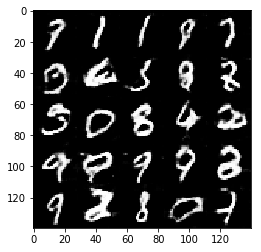

Epoch 1/2... Discriminator Loss: 0.8912... Generator Loss: 1.6647
Epoch 1/2... Discriminator Loss: 0.9158... Generator Loss: 0.8568
Epoch 1/2... Discriminator Loss: 1.0340... Generator Loss: 0.6001
Epoch 1/2... Discriminator Loss: 0.6896... Generator Loss: 1.4157
Epoch 1/2... Discriminator Loss: 1.1337... Generator Loss: 0.6834
Epoch 1/2... Discriminator Loss: 1.2407... Generator Loss: 0.5577
Epoch 1/2... Discriminator Loss: 0.8069... Generator Loss: 1.3243
Epoch 1/2... Discriminator Loss: 0.9546... Generator Loss: 0.7754
Epoch 1/2... Discriminator Loss: 0.7950... Generator Loss: 1.5139
Epoch 1/2... Discriminator Loss: 0.7541... Generator Loss: 1.3607


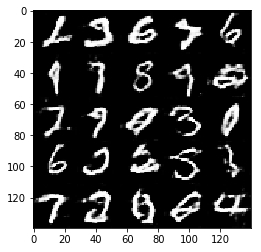

Epoch 1/2... Discriminator Loss: 0.8447... Generator Loss: 0.9762
Epoch 1/2... Discriminator Loss: 0.8978... Generator Loss: 1.1321
Epoch 1/2... Discriminator Loss: 1.1484... Generator Loss: 0.5344
Epoch 1/2... Discriminator Loss: 1.4223... Generator Loss: 0.3897
Epoch 1/2... Discriminator Loss: 1.0855... Generator Loss: 0.7016
Epoch 1/2... Discriminator Loss: 0.8598... Generator Loss: 1.2115
Epoch 1/2... Discriminator Loss: 1.0411... Generator Loss: 0.6194
Epoch 1/2... Discriminator Loss: 0.9597... Generator Loss: 0.9228
Epoch 1/2... Discriminator Loss: 1.0131... Generator Loss: 0.8716
Epoch 1/2... Discriminator Loss: 1.4667... Generator Loss: 0.4160


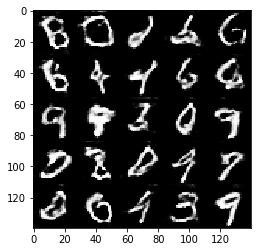

Epoch 1/2... Discriminator Loss: 1.2893... Generator Loss: 0.4787
Epoch 1/2... Discriminator Loss: 0.8165... Generator Loss: 1.0164
Epoch 1/2... Discriminator Loss: 1.0340... Generator Loss: 1.1094
Epoch 1/2... Discriminator Loss: 1.8234... Generator Loss: 0.2587
Epoch 1/2... Discriminator Loss: 1.0567... Generator Loss: 0.6501
Epoch 1/2... Discriminator Loss: 0.8318... Generator Loss: 0.9234
Epoch 1/2... Discriminator Loss: 0.7471... Generator Loss: 1.2074
Epoch 1/2... Discriminator Loss: 1.3366... Generator Loss: 0.4550
Epoch 1/2... Discriminator Loss: 0.9021... Generator Loss: 0.7232
Epoch 1/2... Discriminator Loss: 0.7914... Generator Loss: 0.9227


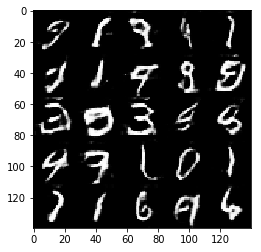

Epoch 1/2... Discriminator Loss: 0.7257... Generator Loss: 1.9355
Epoch 1/2... Discriminator Loss: 1.3531... Generator Loss: 0.4539
Epoch 1/2... Discriminator Loss: 1.5300... Generator Loss: 0.3076
Epoch 1/2... Discriminator Loss: 1.1355... Generator Loss: 0.5648
Epoch 1/2... Discriminator Loss: 0.9407... Generator Loss: 2.5540
Epoch 1/2... Discriminator Loss: 0.8977... Generator Loss: 0.8996
Epoch 1/2... Discriminator Loss: 1.0684... Generator Loss: 0.7129
Epoch 1/2... Discriminator Loss: 0.9914... Generator Loss: 1.0824
Epoch 1/2... Discriminator Loss: 1.2581... Generator Loss: 0.5066
Epoch 1/2... Discriminator Loss: 0.9768... Generator Loss: 0.9444


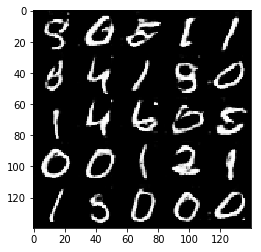

Epoch 1/2... Discriminator Loss: 0.8985... Generator Loss: 0.7868
Epoch 1/2... Discriminator Loss: 0.8117... Generator Loss: 1.7336
Epoch 1/2... Discriminator Loss: 0.8503... Generator Loss: 0.9201
Epoch 1/2... Discriminator Loss: 0.6728... Generator Loss: 1.4202
Epoch 1/2... Discriminator Loss: 0.7760... Generator Loss: 0.9444
Epoch 1/2... Discriminator Loss: 1.0054... Generator Loss: 0.6858
Epoch 1/2... Discriminator Loss: 0.8217... Generator Loss: 0.8823
Epoch 1/2... Discriminator Loss: 1.5745... Generator Loss: 0.3932
Epoch 1/2... Discriminator Loss: 0.9491... Generator Loss: 0.6677
Epoch 1/2... Discriminator Loss: 0.8590... Generator Loss: 1.2248


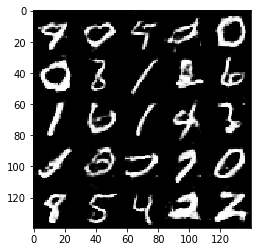

Epoch 1/2... Discriminator Loss: 1.1534... Generator Loss: 0.5823
Epoch 1/2... Discriminator Loss: 1.1580... Generator Loss: 1.2688
Epoch 1/2... Discriminator Loss: 0.6954... Generator Loss: 1.3242
Epoch 1/2... Discriminator Loss: 0.6703... Generator Loss: 1.4591
Epoch 1/2... Discriminator Loss: 0.9914... Generator Loss: 0.6742
Epoch 1/2... Discriminator Loss: 1.0418... Generator Loss: 0.8362
Epoch 1/2... Discriminator Loss: 0.6726... Generator Loss: 1.3214
Epoch 1/2... Discriminator Loss: 0.8322... Generator Loss: 1.2917
Epoch 1/2... Discriminator Loss: 1.2523... Generator Loss: 0.4429
Epoch 1/2... Discriminator Loss: 1.1144... Generator Loss: 0.5875


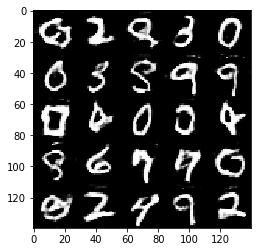

Epoch 1/2... Discriminator Loss: 2.6822... Generator Loss: 0.1002
Epoch 1/2... Discriminator Loss: 0.8891... Generator Loss: 0.9459
Epoch 1/2... Discriminator Loss: 0.8713... Generator Loss: 1.1173
Epoch 1/2... Discriminator Loss: 1.0696... Generator Loss: 0.5361
Epoch 1/2... Discriminator Loss: 1.5820... Generator Loss: 0.3185
Epoch 1/2... Discriminator Loss: 0.7141... Generator Loss: 1.0762
Epoch 1/2... Discriminator Loss: 0.8645... Generator Loss: 1.1659
Epoch 2/2... Discriminator Loss: 1.4997... Generator Loss: 0.3510
Epoch 2/2... Discriminator Loss: 1.2461... Generator Loss: 2.1732
Epoch 2/2... Discriminator Loss: 1.1164... Generator Loss: 0.5581


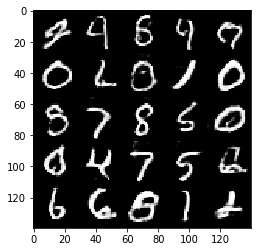

Epoch 2/2... Discriminator Loss: 0.7793... Generator Loss: 1.1678
Epoch 2/2... Discriminator Loss: 0.6192... Generator Loss: 1.4109
Epoch 2/2... Discriminator Loss: 0.8836... Generator Loss: 1.6616
Epoch 2/2... Discriminator Loss: 0.5965... Generator Loss: 1.3750
Epoch 2/2... Discriminator Loss: 0.8363... Generator Loss: 1.3194
Epoch 2/2... Discriminator Loss: 0.8324... Generator Loss: 0.8878
Epoch 2/2... Discriminator Loss: 1.1182... Generator Loss: 0.6842
Epoch 2/2... Discriminator Loss: 1.0577... Generator Loss: 0.6495
Epoch 2/2... Discriminator Loss: 1.4002... Generator Loss: 0.4352
Epoch 2/2... Discriminator Loss: 1.4665... Generator Loss: 0.3708


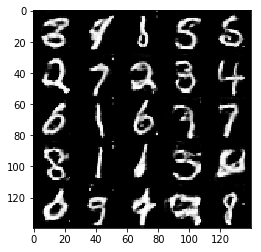

Epoch 2/2... Discriminator Loss: 0.9054... Generator Loss: 1.6317
Epoch 2/2... Discriminator Loss: 0.8061... Generator Loss: 0.8905
Epoch 2/2... Discriminator Loss: 0.8626... Generator Loss: 0.8049
Epoch 2/2... Discriminator Loss: 0.5710... Generator Loss: 1.9816
Epoch 2/2... Discriminator Loss: 1.0170... Generator Loss: 0.7128
Epoch 2/2... Discriminator Loss: 1.2037... Generator Loss: 0.5293
Epoch 2/2... Discriminator Loss: 0.8159... Generator Loss: 1.0501
Epoch 2/2... Discriminator Loss: 0.7730... Generator Loss: 1.2198
Epoch 2/2... Discriminator Loss: 0.9720... Generator Loss: 0.9622
Epoch 2/2... Discriminator Loss: 0.9531... Generator Loss: 0.9052


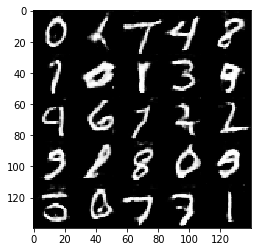

Epoch 2/2... Discriminator Loss: 0.7329... Generator Loss: 1.0633
Epoch 2/2... Discriminator Loss: 1.2993... Generator Loss: 0.5234
Epoch 2/2... Discriminator Loss: 0.8125... Generator Loss: 1.1722
Epoch 2/2... Discriminator Loss: 0.9345... Generator Loss: 0.8441
Epoch 2/2... Discriminator Loss: 1.1436... Generator Loss: 0.5435
Epoch 2/2... Discriminator Loss: 1.4766... Generator Loss: 0.3432
Epoch 2/2... Discriminator Loss: 0.6559... Generator Loss: 1.0239
Epoch 2/2... Discriminator Loss: 1.9985... Generator Loss: 0.1842
Epoch 2/2... Discriminator Loss: 0.6940... Generator Loss: 1.1394
Epoch 2/2... Discriminator Loss: 1.0014... Generator Loss: 0.9437


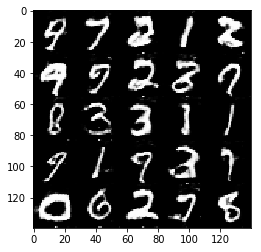

Epoch 2/2... Discriminator Loss: 0.8117... Generator Loss: 1.5326
Epoch 2/2... Discriminator Loss: 0.9779... Generator Loss: 0.7463
Epoch 2/2... Discriminator Loss: 0.7225... Generator Loss: 1.8685
Epoch 2/2... Discriminator Loss: 0.7287... Generator Loss: 1.0841
Epoch 2/2... Discriminator Loss: 1.0101... Generator Loss: 0.7248
Epoch 2/2... Discriminator Loss: 1.0357... Generator Loss: 0.9426
Epoch 2/2... Discriminator Loss: 0.9977... Generator Loss: 0.5873
Epoch 2/2... Discriminator Loss: 1.0203... Generator Loss: 0.6352
Epoch 2/2... Discriminator Loss: 1.8637... Generator Loss: 0.2386
Epoch 2/2... Discriminator Loss: 1.3080... Generator Loss: 0.4643


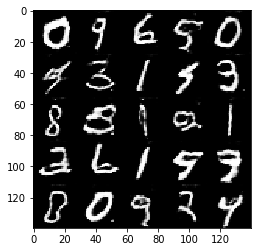

Epoch 2/2... Discriminator Loss: 1.1160... Generator Loss: 0.5649
Epoch 2/2... Discriminator Loss: 1.4026... Generator Loss: 0.5294
Epoch 2/2... Discriminator Loss: 1.2496... Generator Loss: 0.4779
Epoch 2/2... Discriminator Loss: 1.2869... Generator Loss: 0.4080
Epoch 2/2... Discriminator Loss: 1.5499... Generator Loss: 0.3043
Epoch 2/2... Discriminator Loss: 1.0897... Generator Loss: 0.5678
Epoch 2/2... Discriminator Loss: 0.6931... Generator Loss: 2.8999
Epoch 2/2... Discriminator Loss: 1.1640... Generator Loss: 0.5259
Epoch 2/2... Discriminator Loss: 0.8768... Generator Loss: 0.7986
Epoch 2/2... Discriminator Loss: 1.6252... Generator Loss: 0.2812


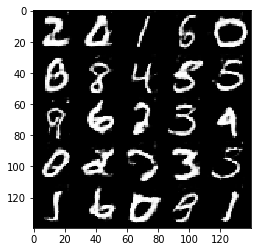

Epoch 2/2... Discriminator Loss: 0.9006... Generator Loss: 0.7653
Epoch 2/2... Discriminator Loss: 0.7118... Generator Loss: 1.5954
Epoch 2/2... Discriminator Loss: 1.2895... Generator Loss: 0.4423
Epoch 2/2... Discriminator Loss: 0.9828... Generator Loss: 0.7399
Epoch 2/2... Discriminator Loss: 0.7647... Generator Loss: 0.9185
Epoch 2/2... Discriminator Loss: 1.6351... Generator Loss: 0.3298
Epoch 2/2... Discriminator Loss: 0.7107... Generator Loss: 1.3601
Epoch 2/2... Discriminator Loss: 0.6972... Generator Loss: 1.3631
Epoch 2/2... Discriminator Loss: 1.1429... Generator Loss: 0.6253
Epoch 2/2... Discriminator Loss: 0.6536... Generator Loss: 1.1327


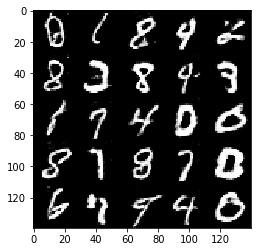

Epoch 2/2... Discriminator Loss: 1.2413... Generator Loss: 0.5199
Epoch 2/2... Discriminator Loss: 0.4441... Generator Loss: 1.4345
Epoch 2/2... Discriminator Loss: 0.6232... Generator Loss: 1.1167
Epoch 2/2... Discriminator Loss: 1.6297... Generator Loss: 0.4154
Epoch 2/2... Discriminator Loss: 0.7415... Generator Loss: 1.2627
Epoch 2/2... Discriminator Loss: 0.8613... Generator Loss: 0.6832
Epoch 2/2... Discriminator Loss: 0.5709... Generator Loss: 1.4171
Epoch 2/2... Discriminator Loss: 0.9295... Generator Loss: 0.7303
Epoch 2/2... Discriminator Loss: 0.5860... Generator Loss: 1.2306
Epoch 2/2... Discriminator Loss: 0.5222... Generator Loss: 1.3042


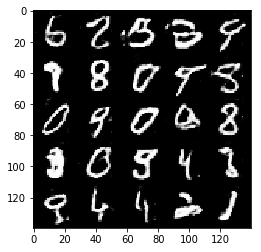

Epoch 2/2... Discriminator Loss: 1.0221... Generator Loss: 0.7805
Epoch 2/2... Discriminator Loss: 0.8303... Generator Loss: 0.9320
Epoch 2/2... Discriminator Loss: 1.4929... Generator Loss: 0.4966
Epoch 2/2... Discriminator Loss: 0.8023... Generator Loss: 2.1639
Epoch 2/2... Discriminator Loss: 0.9662... Generator Loss: 0.8838
Epoch 2/2... Discriminator Loss: 1.0747... Generator Loss: 0.7358
Epoch 2/2... Discriminator Loss: 0.9354... Generator Loss: 0.7202
Epoch 2/2... Discriminator Loss: 1.0775... Generator Loss: 0.6456
Epoch 2/2... Discriminator Loss: 1.2900... Generator Loss: 0.4230
Epoch 2/2... Discriminator Loss: 0.6332... Generator Loss: 1.1076


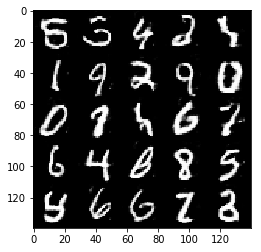

Epoch 2/2... Discriminator Loss: 0.9068... Generator Loss: 2.8601
Epoch 2/2... Discriminator Loss: 1.2165... Generator Loss: 0.4810
Epoch 2/2... Discriminator Loss: 0.6514... Generator Loss: 1.2825
Epoch 2/2... Discriminator Loss: 0.6664... Generator Loss: 1.0777
Epoch 2/2... Discriminator Loss: 0.9261... Generator Loss: 1.4971
Epoch 2/2... Discriminator Loss: 0.7114... Generator Loss: 1.6637
Epoch 2/2... Discriminator Loss: 0.9119... Generator Loss: 0.8819
Epoch 2/2... Discriminator Loss: 0.5706... Generator Loss: 1.5431
Epoch 2/2... Discriminator Loss: 0.6826... Generator Loss: 1.0942
Epoch 2/2... Discriminator Loss: 0.6520... Generator Loss: 1.3867


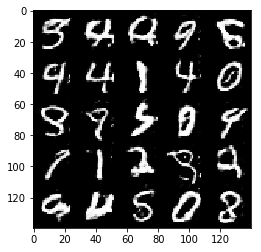

Epoch 2/2... Discriminator Loss: 0.6873... Generator Loss: 2.2711
Epoch 2/2... Discriminator Loss: 0.6976... Generator Loss: 1.2734
Epoch 2/2... Discriminator Loss: 0.6338... Generator Loss: 1.2654
Epoch 2/2... Discriminator Loss: 0.7949... Generator Loss: 0.9950
Epoch 2/2... Discriminator Loss: 0.7310... Generator Loss: 1.0160
Epoch 2/2... Discriminator Loss: 0.8557... Generator Loss: 1.5058
Epoch 2/2... Discriminator Loss: 1.1088... Generator Loss: 0.7979
Epoch 2/2... Discriminator Loss: 1.2999... Generator Loss: 0.5702
Epoch 2/2... Discriminator Loss: 1.2086... Generator Loss: 0.4947
Epoch 2/2... Discriminator Loss: 1.1882... Generator Loss: 0.6208


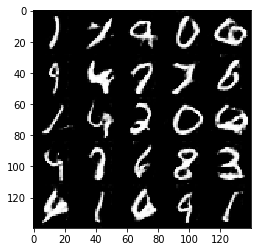

Epoch 2/2... Discriminator Loss: 0.9506... Generator Loss: 0.8990
Epoch 2/2... Discriminator Loss: 0.6664... Generator Loss: 1.4392
Epoch 2/2... Discriminator Loss: 1.1082... Generator Loss: 0.5612
Epoch 2/2... Discriminator Loss: 0.8031... Generator Loss: 0.9132
Epoch 2/2... Discriminator Loss: 1.3538... Generator Loss: 0.4759
Epoch 2/2... Discriminator Loss: 0.5822... Generator Loss: 1.3131
Epoch 2/2... Discriminator Loss: 1.7135... Generator Loss: 0.2877
Epoch 2/2... Discriminator Loss: 0.8827... Generator Loss: 0.7831
Epoch 2/2... Discriminator Loss: 0.7248... Generator Loss: 1.0883
Epoch 2/2... Discriminator Loss: 0.6689... Generator Loss: 1.0748


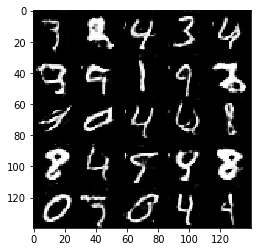

Epoch 2/2... Discriminator Loss: 1.4148... Generator Loss: 0.4364
Epoch 2/2... Discriminator Loss: 0.9867... Generator Loss: 1.6674
Epoch 2/2... Discriminator Loss: 0.6195... Generator Loss: 1.2399
Epoch 2/2... Discriminator Loss: 0.7317... Generator Loss: 1.7650
Epoch 2/2... Discriminator Loss: 1.6286... Generator Loss: 0.3291
Epoch 2/2... Discriminator Loss: 0.7258... Generator Loss: 1.0837
Epoch 2/2... Discriminator Loss: 1.4048... Generator Loss: 0.3892
Epoch 2/2... Discriminator Loss: 0.8217... Generator Loss: 0.8675
Epoch 2/2... Discriminator Loss: 1.0663... Generator Loss: 0.5669
Epoch 2/2... Discriminator Loss: 0.8262... Generator Loss: 1.2644


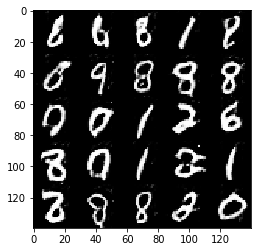

Epoch 2/2... Discriminator Loss: 1.0927... Generator Loss: 0.7474
Epoch 2/2... Discriminator Loss: 0.9207... Generator Loss: 1.0098
Epoch 2/2... Discriminator Loss: 0.8292... Generator Loss: 1.4212
Epoch 2/2... Discriminator Loss: 0.5813... Generator Loss: 1.2446
Epoch 2/2... Discriminator Loss: 1.3036... Generator Loss: 0.4389
Epoch 2/2... Discriminator Loss: 0.5027... Generator Loss: 1.4193
Epoch 2/2... Discriminator Loss: 0.6885... Generator Loss: 1.0395
Epoch 2/2... Discriminator Loss: 0.5605... Generator Loss: 1.3236
Epoch 2/2... Discriminator Loss: 1.2291... Generator Loss: 0.6654
Epoch 2/2... Discriminator Loss: 1.0164... Generator Loss: 0.6204


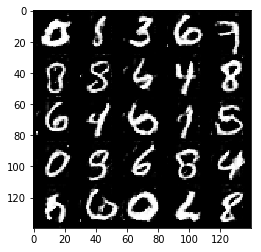

Epoch 2/2... Discriminator Loss: 2.2808... Generator Loss: 0.1481
Epoch 2/2... Discriminator Loss: 1.1623... Generator Loss: 0.5864
Epoch 2/2... Discriminator Loss: 0.8677... Generator Loss: 0.7358
Epoch 2/2... Discriminator Loss: 0.4817... Generator Loss: 1.9988
Epoch 2/2... Discriminator Loss: 0.4592... Generator Loss: 1.4651
Epoch 2/2... Discriminator Loss: 0.6927... Generator Loss: 2.2503
Epoch 2/2... Discriminator Loss: 0.5588... Generator Loss: 2.4055
Epoch 2/2... Discriminator Loss: 0.7851... Generator Loss: 0.9701
Epoch 2/2... Discriminator Loss: 0.6155... Generator Loss: 1.1299
Epoch 2/2... Discriminator Loss: 0.7284... Generator Loss: 0.9103


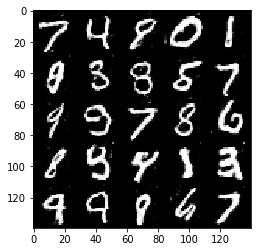

Epoch 2/2... Discriminator Loss: 0.8243... Generator Loss: 0.8720
Epoch 2/2... Discriminator Loss: 0.5774... Generator Loss: 1.4986
Epoch 2/2... Discriminator Loss: 1.5195... Generator Loss: 0.3358
Epoch 2/2... Discriminator Loss: 0.8344... Generator Loss: 1.4411
Epoch 2/2... Discriminator Loss: 0.9908... Generator Loss: 1.0726
Epoch 2/2... Discriminator Loss: 0.7447... Generator Loss: 1.4061
Epoch 2/2... Discriminator Loss: 0.2727... Generator Loss: 2.0534
Epoch 2/2... Discriminator Loss: 0.3945... Generator Loss: 2.2562
Epoch 2/2... Discriminator Loss: 0.4915... Generator Loss: 1.8050
Epoch 2/2... Discriminator Loss: 0.6412... Generator Loss: 1.1090


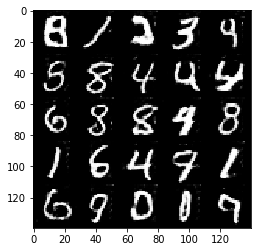

Epoch 2/2... Discriminator Loss: 1.7519... Generator Loss: 0.3135
Epoch 2/2... Discriminator Loss: 0.6978... Generator Loss: 1.2418
Epoch 2/2... Discriminator Loss: 3.8138... Generator Loss: 6.3823
Epoch 2/2... Discriminator Loss: 0.6640... Generator Loss: 1.3101
Epoch 2/2... Discriminator Loss: 0.8417... Generator Loss: 1.2018
Epoch 2/2... Discriminator Loss: 0.5010... Generator Loss: 1.6047
Epoch 2/2... Discriminator Loss: 0.8431... Generator Loss: 0.7729
Epoch 2/2... Discriminator Loss: 1.6025... Generator Loss: 0.3043
Epoch 2/2... Discriminator Loss: 0.8230... Generator Loss: 0.8557
Epoch 2/2... Discriminator Loss: 0.7570... Generator Loss: 0.9914


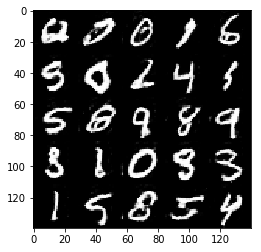

Epoch 2/2... Discriminator Loss: 0.5909... Generator Loss: 1.3962
Epoch 2/2... Discriminator Loss: 0.6035... Generator Loss: 2.1649
Epoch 2/2... Discriminator Loss: 1.4933... Generator Loss: 0.3536
Epoch 2/2... Discriminator Loss: 1.0567... Generator Loss: 0.7016
Epoch 2/2... Discriminator Loss: 0.9347... Generator Loss: 0.7635
Epoch 2/2... Discriminator Loss: 0.8059... Generator Loss: 0.9349
Epoch 2/2... Discriminator Loss: 0.6555... Generator Loss: 1.3075
Epoch 2/2... Discriminator Loss: 0.8191... Generator Loss: 1.7330
Epoch 2/2... Discriminator Loss: 1.2338... Generator Loss: 2.0574
Epoch 2/2... Discriminator Loss: 0.9668... Generator Loss: 0.7539


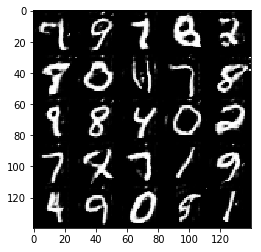

Epoch 2/2... Discriminator Loss: 0.8877... Generator Loss: 0.7097
Epoch 2/2... Discriminator Loss: 1.3640... Generator Loss: 0.4561
Epoch 2/2... Discriminator Loss: 0.8832... Generator Loss: 0.7471
Epoch 2/2... Discriminator Loss: 0.8393... Generator Loss: 1.0122
Epoch 2/2... Discriminator Loss: 1.1740... Generator Loss: 0.5220
Epoch 2/2... Discriminator Loss: 0.7052... Generator Loss: 1.0924
Epoch 2/2... Discriminator Loss: 0.5427... Generator Loss: 1.5194
Epoch 2/2... Discriminator Loss: 1.4881... Generator Loss: 0.3457
Epoch 2/2... Discriminator Loss: 0.6983... Generator Loss: 2.3891
Epoch 2/2... Discriminator Loss: 0.6347... Generator Loss: 1.0998


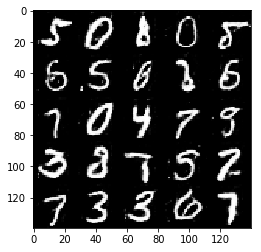

Epoch 2/2... Discriminator Loss: 0.5802... Generator Loss: 1.3169
Epoch 2/2... Discriminator Loss: 1.4187... Generator Loss: 0.4088
Epoch 2/2... Discriminator Loss: 1.0482... Generator Loss: 0.6640
Epoch 2/2... Discriminator Loss: 0.5266... Generator Loss: 1.4990
Epoch 2/2... Discriminator Loss: 0.4375... Generator Loss: 1.9864


In [34]:
batch_size = 32
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 3.2086... Generator Loss: 0.0585
Epoch 1/1... Discriminator Loss: 1.6096... Generator Loss: 0.3253
Epoch 1/1... Discriminator Loss: 1.3225... Generator Loss: 0.5207
Epoch 1/1... Discriminator Loss: 0.9610... Generator Loss: 0.8351
Epoch 1/1... Discriminator Loss: 0.9516... Generator Loss: 0.8760
Epoch 1/1... Discriminator Loss: 0.8213... Generator Loss: 1.0053
Epoch 1/1... Discriminator Loss: 0.9951... Generator Loss: 0.8150
Epoch 1/1... Discriminator Loss: 0.9697... Generator Loss: 0.9894
Epoch 1/1... Discriminator Loss: 1.0192... Generator Loss: 1.0793
Epoch 1/1... Discriminator Loss: 0.7721... Generator Loss: 1.0902


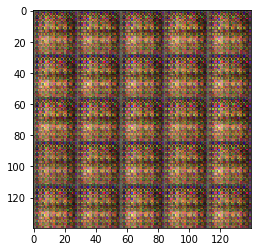

Epoch 1/1... Discriminator Loss: 0.8949... Generator Loss: 1.1113
Epoch 1/1... Discriminator Loss: 0.5133... Generator Loss: 1.3721
Epoch 1/1... Discriminator Loss: 0.9183... Generator Loss: 1.3303
Epoch 1/1... Discriminator Loss: 1.1038... Generator Loss: 0.9005
Epoch 1/1... Discriminator Loss: 0.8372... Generator Loss: 1.2951
Epoch 1/1... Discriminator Loss: 0.9029... Generator Loss: 1.2552
Epoch 1/1... Discriminator Loss: 0.8973... Generator Loss: 0.9149
Epoch 1/1... Discriminator Loss: 0.3482... Generator Loss: 1.9115
Epoch 1/1... Discriminator Loss: 0.4774... Generator Loss: 1.4685
Epoch 1/1... Discriminator Loss: 0.4418... Generator Loss: 1.9259


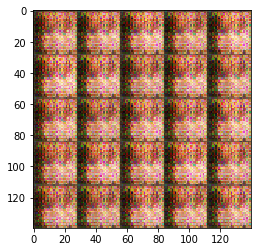

Epoch 1/1... Discriminator Loss: 0.4039... Generator Loss: 1.8616
Epoch 1/1... Discriminator Loss: 0.6136... Generator Loss: 1.4443
Epoch 1/1... Discriminator Loss: 0.6763... Generator Loss: 1.0842
Epoch 1/1... Discriminator Loss: 0.7640... Generator Loss: 1.2249
Epoch 1/1... Discriminator Loss: 1.1155... Generator Loss: 1.0309
Epoch 1/1... Discriminator Loss: 1.9018... Generator Loss: 0.5406
Epoch 1/1... Discriminator Loss: 1.2697... Generator Loss: 0.8245
Epoch 1/1... Discriminator Loss: 1.2444... Generator Loss: 0.9246
Epoch 1/1... Discriminator Loss: 1.1517... Generator Loss: 0.6554
Epoch 1/1... Discriminator Loss: 1.0305... Generator Loss: 1.0581


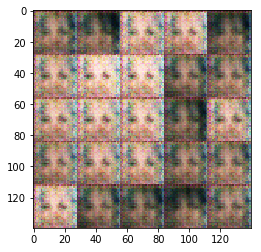

Epoch 1/1... Discriminator Loss: 1.1957... Generator Loss: 0.8693
Epoch 1/1... Discriminator Loss: 1.6916... Generator Loss: 0.5462
Epoch 1/1... Discriminator Loss: 0.6714... Generator Loss: 0.9799
Epoch 1/1... Discriminator Loss: 0.9397... Generator Loss: 0.8558
Epoch 1/1... Discriminator Loss: 0.8021... Generator Loss: 1.2003
Epoch 1/1... Discriminator Loss: 0.7127... Generator Loss: 1.0272
Epoch 1/1... Discriminator Loss: 1.1187... Generator Loss: 1.0133
Epoch 1/1... Discriminator Loss: 0.8613... Generator Loss: 1.1850
Epoch 1/1... Discriminator Loss: 1.3453... Generator Loss: 0.7212
Epoch 1/1... Discriminator Loss: 0.9882... Generator Loss: 0.8785


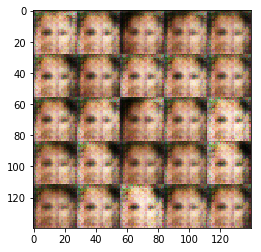

Epoch 1/1... Discriminator Loss: 1.4791... Generator Loss: 0.4547
Epoch 1/1... Discriminator Loss: 1.4985... Generator Loss: 0.8356
Epoch 1/1... Discriminator Loss: 1.0208... Generator Loss: 0.8024
Epoch 1/1... Discriminator Loss: 0.7636... Generator Loss: 1.3227
Epoch 1/1... Discriminator Loss: 0.9062... Generator Loss: 1.0424
Epoch 1/1... Discriminator Loss: 0.8890... Generator Loss: 1.7975
Epoch 1/1... Discriminator Loss: 1.4647... Generator Loss: 0.5958
Epoch 1/1... Discriminator Loss: 0.8148... Generator Loss: 1.0863
Epoch 1/1... Discriminator Loss: 0.9832... Generator Loss: 1.0741
Epoch 1/1... Discriminator Loss: 0.9785... Generator Loss: 1.0503


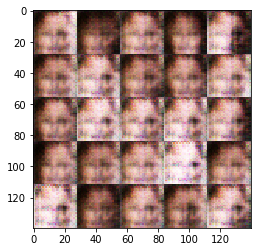

Epoch 1/1... Discriminator Loss: 0.4659... Generator Loss: 1.8726
Epoch 1/1... Discriminator Loss: 0.7376... Generator Loss: 1.4003
Epoch 1/1... Discriminator Loss: 1.3698... Generator Loss: 0.8136
Epoch 1/1... Discriminator Loss: 0.6558... Generator Loss: 1.5248
Epoch 1/1... Discriminator Loss: 0.9246... Generator Loss: 1.2614
Epoch 1/1... Discriminator Loss: 0.5935... Generator Loss: 1.6312
Epoch 1/1... Discriminator Loss: 0.6422... Generator Loss: 1.1799
Epoch 1/1... Discriminator Loss: 0.6452... Generator Loss: 1.0878
Epoch 1/1... Discriminator Loss: 1.4725... Generator Loss: 0.5149
Epoch 1/1... Discriminator Loss: 0.9322... Generator Loss: 1.3803


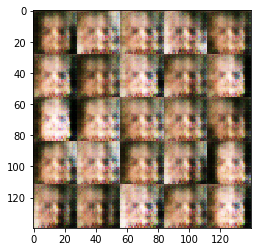

Epoch 1/1... Discriminator Loss: 1.2254... Generator Loss: 0.6559
Epoch 1/1... Discriminator Loss: 0.9481... Generator Loss: 0.6155
Epoch 1/1... Discriminator Loss: 0.6834... Generator Loss: 1.0272
Epoch 1/1... Discriminator Loss: 0.5335... Generator Loss: 1.2452
Epoch 1/1... Discriminator Loss: 0.3439... Generator Loss: 2.3748
Epoch 1/1... Discriminator Loss: 1.6378... Generator Loss: 0.3738
Epoch 1/1... Discriminator Loss: 0.7184... Generator Loss: 1.4315
Epoch 1/1... Discriminator Loss: 1.0166... Generator Loss: 0.9862
Epoch 1/1... Discriminator Loss: 0.9427... Generator Loss: 1.7316
Epoch 1/1... Discriminator Loss: 1.0058... Generator Loss: 0.6611


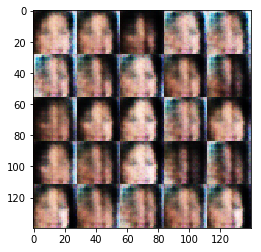

Epoch 1/1... Discriminator Loss: 0.8536... Generator Loss: 1.1864
Epoch 1/1... Discriminator Loss: 0.5425... Generator Loss: 1.3144
Epoch 1/1... Discriminator Loss: 0.4901... Generator Loss: 1.3380
Epoch 1/1... Discriminator Loss: 0.2605... Generator Loss: 2.3486
Epoch 1/1... Discriminator Loss: 0.4671... Generator Loss: 1.3796
Epoch 1/1... Discriminator Loss: 0.9517... Generator Loss: 1.2927
Epoch 1/1... Discriminator Loss: 0.5029... Generator Loss: 1.8086
Epoch 1/1... Discriminator Loss: 0.9221... Generator Loss: 0.8922
Epoch 1/1... Discriminator Loss: 0.8880... Generator Loss: 0.8862
Epoch 1/1... Discriminator Loss: 0.8775... Generator Loss: 1.1944


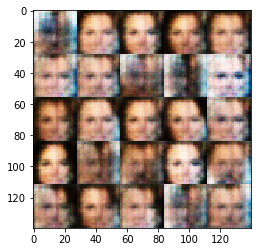

Epoch 1/1... Discriminator Loss: 0.7846... Generator Loss: 1.1693
Epoch 1/1... Discriminator Loss: 0.6926... Generator Loss: 1.1877
Epoch 1/1... Discriminator Loss: 1.2794... Generator Loss: 0.4574
Epoch 1/1... Discriminator Loss: 0.3967... Generator Loss: 1.4066
Epoch 1/1... Discriminator Loss: 0.4893... Generator Loss: 1.2308
Epoch 1/1... Discriminator Loss: 0.8215... Generator Loss: 2.7223
Epoch 1/1... Discriminator Loss: 0.3443... Generator Loss: 1.6791
Epoch 1/1... Discriminator Loss: 0.7297... Generator Loss: 1.2911
Epoch 1/1... Discriminator Loss: 0.2994... Generator Loss: 1.7406
Epoch 1/1... Discriminator Loss: 0.5622... Generator Loss: 3.4190


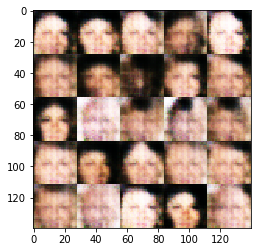

Epoch 1/1... Discriminator Loss: 0.4465... Generator Loss: 2.3235
Epoch 1/1... Discriminator Loss: 0.7133... Generator Loss: 1.3577
Epoch 1/1... Discriminator Loss: 0.9257... Generator Loss: 0.5714
Epoch 1/1... Discriminator Loss: 0.3582... Generator Loss: 2.8875
Epoch 1/1... Discriminator Loss: 0.5451... Generator Loss: 2.5376
Epoch 1/1... Discriminator Loss: 0.9080... Generator Loss: 0.6088
Epoch 1/1... Discriminator Loss: 0.6875... Generator Loss: 0.9442
Epoch 1/1... Discriminator Loss: 0.6557... Generator Loss: 1.0465
Epoch 1/1... Discriminator Loss: 0.3701... Generator Loss: 2.1709
Epoch 1/1... Discriminator Loss: 0.3953... Generator Loss: 1.9161


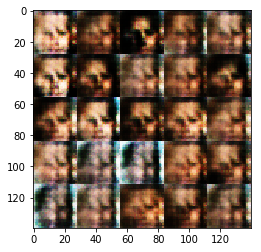

Epoch 1/1... Discriminator Loss: 0.6928... Generator Loss: 0.9502
Epoch 1/1... Discriminator Loss: 0.8834... Generator Loss: 0.7393
Epoch 1/1... Discriminator Loss: 0.4390... Generator Loss: 2.9620
Epoch 1/1... Discriminator Loss: 0.7130... Generator Loss: 1.5436
Epoch 1/1... Discriminator Loss: 0.6451... Generator Loss: 0.8675
Epoch 1/1... Discriminator Loss: 0.3909... Generator Loss: 1.9756
Epoch 1/1... Discriminator Loss: 0.1493... Generator Loss: 2.7643
Epoch 1/1... Discriminator Loss: 0.1292... Generator Loss: 3.5681
Epoch 1/1... Discriminator Loss: 0.5910... Generator Loss: 1.1287
Epoch 1/1... Discriminator Loss: 1.3248... Generator Loss: 0.3461


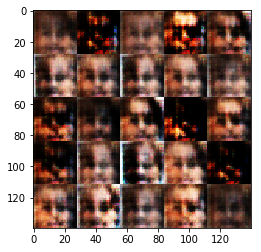

Epoch 1/1... Discriminator Loss: 0.0931... Generator Loss: 3.6527
Epoch 1/1... Discriminator Loss: 0.9127... Generator Loss: 2.7794
Epoch 1/1... Discriminator Loss: 1.6080... Generator Loss: 0.3350
Epoch 1/1... Discriminator Loss: 0.2394... Generator Loss: 2.0544
Epoch 1/1... Discriminator Loss: 0.6189... Generator Loss: 1.2777
Epoch 1/1... Discriminator Loss: 0.4995... Generator Loss: 1.5451
Epoch 1/1... Discriminator Loss: 0.2724... Generator Loss: 7.8376
Epoch 1/1... Discriminator Loss: 2.5541... Generator Loss: 0.1041
Epoch 1/1... Discriminator Loss: 0.9586... Generator Loss: 0.9869
Epoch 1/1... Discriminator Loss: 0.4610... Generator Loss: 1.3409


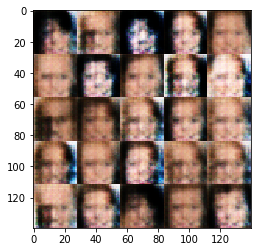

Epoch 1/1... Discriminator Loss: 0.6833... Generator Loss: 1.5541
Epoch 1/1... Discriminator Loss: 0.1094... Generator Loss: 6.0169
Epoch 1/1... Discriminator Loss: 0.7798... Generator Loss: 1.1484
Epoch 1/1... Discriminator Loss: 0.4656... Generator Loss: 1.6271
Epoch 1/1... Discriminator Loss: 0.3870... Generator Loss: 3.5074
Epoch 1/1... Discriminator Loss: 0.6559... Generator Loss: 1.0768
Epoch 1/1... Discriminator Loss: 0.8548... Generator Loss: 1.0098
Epoch 1/1... Discriminator Loss: 0.8957... Generator Loss: 0.9348
Epoch 1/1... Discriminator Loss: 0.1171... Generator Loss: 6.2532
Epoch 1/1... Discriminator Loss: 0.3573... Generator Loss: 2.1809


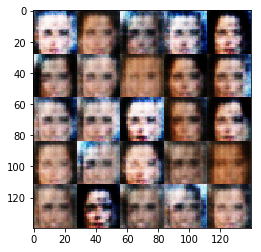

Epoch 1/1... Discriminator Loss: 0.4552... Generator Loss: 1.5359
Epoch 1/1... Discriminator Loss: 0.2670... Generator Loss: 2.8196
Epoch 1/1... Discriminator Loss: 0.0501... Generator Loss: 5.9266
Epoch 1/1... Discriminator Loss: 1.0164... Generator Loss: 0.9574
Epoch 1/1... Discriminator Loss: 0.8302... Generator Loss: 0.8989
Epoch 1/1... Discriminator Loss: 0.7575... Generator Loss: 2.4268
Epoch 1/1... Discriminator Loss: 0.7663... Generator Loss: 0.9461
Epoch 1/1... Discriminator Loss: 0.6056... Generator Loss: 1.3445
Epoch 1/1... Discriminator Loss: 0.3868... Generator Loss: 1.7262
Epoch 1/1... Discriminator Loss: 0.5307... Generator Loss: 1.6104


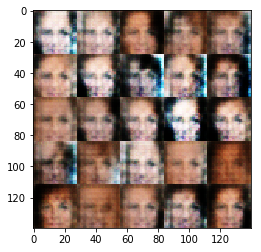

Epoch 1/1... Discriminator Loss: 0.8869... Generator Loss: 0.7424
Epoch 1/1... Discriminator Loss: 0.4347... Generator Loss: 2.6544
Epoch 1/1... Discriminator Loss: 0.6498... Generator Loss: 2.5211
Epoch 1/1... Discriminator Loss: 0.3804... Generator Loss: 4.0819
Epoch 1/1... Discriminator Loss: 0.7729... Generator Loss: 2.6579
Epoch 1/1... Discriminator Loss: 0.4607... Generator Loss: 1.5707
Epoch 1/1... Discriminator Loss: 0.2387... Generator Loss: 2.0761
Epoch 1/1... Discriminator Loss: 0.2141... Generator Loss: 2.3608
Epoch 1/1... Discriminator Loss: 0.0755... Generator Loss: 5.8432
Epoch 1/1... Discriminator Loss: 0.2681... Generator Loss: 2.2941


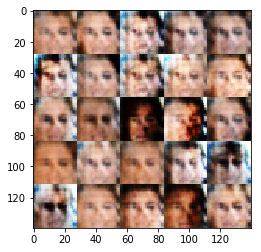

Epoch 1/1... Discriminator Loss: 0.5385... Generator Loss: 1.4408
Epoch 1/1... Discriminator Loss: 0.7754... Generator Loss: 1.2099
Epoch 1/1... Discriminator Loss: 0.8880... Generator Loss: 0.7122
Epoch 1/1... Discriminator Loss: 0.6280... Generator Loss: 1.6506
Epoch 1/1... Discriminator Loss: 0.3320... Generator Loss: 2.3376
Epoch 1/1... Discriminator Loss: 0.1565... Generator Loss: 3.2343
Epoch 1/1... Discriminator Loss: 0.6019... Generator Loss: 1.2490
Epoch 1/1... Discriminator Loss: 0.5679... Generator Loss: 3.3217
Epoch 1/1... Discriminator Loss: 0.6159... Generator Loss: 1.1739
Epoch 1/1... Discriminator Loss: 0.0741... Generator Loss: 3.5930


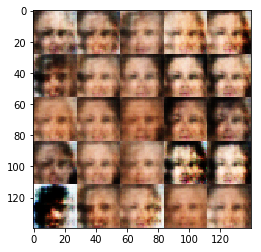

Epoch 1/1... Discriminator Loss: 1.0590... Generator Loss: 0.5734
Epoch 1/1... Discriminator Loss: 0.4055... Generator Loss: 1.7521
Epoch 1/1... Discriminator Loss: 0.2051... Generator Loss: 2.4977
Epoch 1/1... Discriminator Loss: 0.1692... Generator Loss: 3.2315
Epoch 1/1... Discriminator Loss: 0.3032... Generator Loss: 2.0698
Epoch 1/1... Discriminator Loss: 0.2040... Generator Loss: 3.3919
Epoch 1/1... Discriminator Loss: 1.0101... Generator Loss: 3.7497
Epoch 1/1... Discriminator Loss: 2.0068... Generator Loss: 5.2585
Epoch 1/1... Discriminator Loss: 0.4312... Generator Loss: 2.6864
Epoch 1/1... Discriminator Loss: 1.9458... Generator Loss: 0.2594


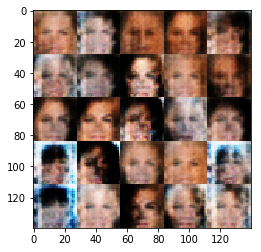

Epoch 1/1... Discriminator Loss: 0.6520... Generator Loss: 0.9556
Epoch 1/1... Discriminator Loss: 0.5357... Generator Loss: 7.5753
Epoch 1/1... Discriminator Loss: 0.7292... Generator Loss: 0.8628
Epoch 1/1... Discriminator Loss: 0.6300... Generator Loss: 1.6925
Epoch 1/1... Discriminator Loss: 0.2807... Generator Loss: 2.6135
Epoch 1/1... Discriminator Loss: 0.2698... Generator Loss: 2.2382
Epoch 1/1... Discriminator Loss: 0.0950... Generator Loss: 3.7434
Epoch 1/1... Discriminator Loss: 0.5192... Generator Loss: 1.5929
Epoch 1/1... Discriminator Loss: 0.6510... Generator Loss: 2.1899
Epoch 1/1... Discriminator Loss: 0.3005... Generator Loss: 2.1261


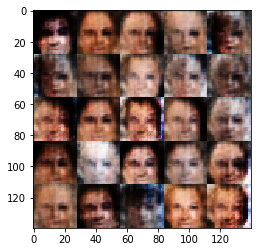

Epoch 1/1... Discriminator Loss: 3.0019... Generator Loss: 5.0603
Epoch 1/1... Discriminator Loss: 0.9431... Generator Loss: 0.7843
Epoch 1/1... Discriminator Loss: 0.7281... Generator Loss: 1.2955
Epoch 1/1... Discriminator Loss: 1.0148... Generator Loss: 1.5462
Epoch 1/1... Discriminator Loss: 0.6882... Generator Loss: 1.3392
Epoch 1/1... Discriminator Loss: 0.7305... Generator Loss: 0.8519
Epoch 1/1... Discriminator Loss: 1.0363... Generator Loss: 2.8178
Epoch 1/1... Discriminator Loss: 0.1249... Generator Loss: 4.4310
Epoch 1/1... Discriminator Loss: 0.6829... Generator Loss: 1.3043
Epoch 1/1... Discriminator Loss: 0.9505... Generator Loss: 0.6506


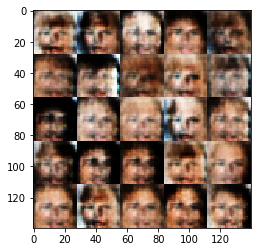

Epoch 1/1... Discriminator Loss: 1.0234... Generator Loss: 0.6925
Epoch 1/1... Discriminator Loss: 0.1371... Generator Loss: 3.3449
Epoch 1/1... Discriminator Loss: 0.6538... Generator Loss: 0.9831
Epoch 1/1... Discriminator Loss: 0.6166... Generator Loss: 0.9563
Epoch 1/1... Discriminator Loss: 0.5452... Generator Loss: 1.2384
Epoch 1/1... Discriminator Loss: 0.2685... Generator Loss: 3.3328
Epoch 1/1... Discriminator Loss: 0.8131... Generator Loss: 0.9613
Epoch 1/1... Discriminator Loss: 0.1763... Generator Loss: 3.3782
Epoch 1/1... Discriminator Loss: 0.1330... Generator Loss: 4.5625
Epoch 1/1... Discriminator Loss: 0.4974... Generator Loss: 1.1458


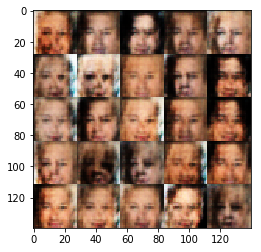

Epoch 1/1... Discriminator Loss: 0.3422... Generator Loss: 1.8170
Epoch 1/1... Discriminator Loss: 0.2144... Generator Loss: 2.5184
Epoch 1/1... Discriminator Loss: 0.7528... Generator Loss: 1.4612
Epoch 1/1... Discriminator Loss: 0.6822... Generator Loss: 0.9478
Epoch 1/1... Discriminator Loss: 0.8158... Generator Loss: 0.7661
Epoch 1/1... Discriminator Loss: 0.2987... Generator Loss: 3.0668
Epoch 1/1... Discriminator Loss: 0.2821... Generator Loss: 2.7094
Epoch 1/1... Discriminator Loss: 0.3149... Generator Loss: 1.9156
Epoch 1/1... Discriminator Loss: 0.9187... Generator Loss: 0.7363
Epoch 1/1... Discriminator Loss: 1.4489... Generator Loss: 3.6341


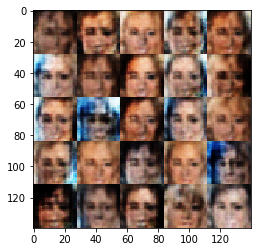

Epoch 1/1... Discriminator Loss: 0.5294... Generator Loss: 1.4632
Epoch 1/1... Discriminator Loss: 0.4756... Generator Loss: 1.6158
Epoch 1/1... Discriminator Loss: 0.1949... Generator Loss: 2.6023
Epoch 1/1... Discriminator Loss: 0.6532... Generator Loss: 1.7833
Epoch 1/1... Discriminator Loss: 0.2388... Generator Loss: 5.7035
Epoch 1/1... Discriminator Loss: 0.3653... Generator Loss: 2.3752
Epoch 1/1... Discriminator Loss: 0.6579... Generator Loss: 1.0874
Epoch 1/1... Discriminator Loss: 0.4604... Generator Loss: 1.3392
Epoch 1/1... Discriminator Loss: 0.3436... Generator Loss: 1.6861
Epoch 1/1... Discriminator Loss: 0.8176... Generator Loss: 1.1549


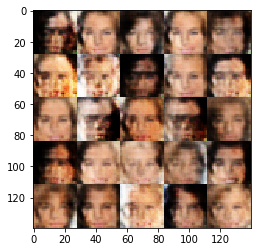

Epoch 1/1... Discriminator Loss: 1.0188... Generator Loss: 0.5809
Epoch 1/1... Discriminator Loss: 0.7344... Generator Loss: 2.0364
Epoch 1/1... Discriminator Loss: 0.1553... Generator Loss: 2.9435
Epoch 1/1... Discriminator Loss: 0.5547... Generator Loss: 1.1050
Epoch 1/1... Discriminator Loss: 0.4358... Generator Loss: 1.3602
Epoch 1/1... Discriminator Loss: 0.4614... Generator Loss: 1.6031
Epoch 1/1... Discriminator Loss: 0.5197... Generator Loss: 1.2125
Epoch 1/1... Discriminator Loss: 0.5514... Generator Loss: 1.7338
Epoch 1/1... Discriminator Loss: 0.2364... Generator Loss: 2.8160
Epoch 1/1... Discriminator Loss: 0.2776... Generator Loss: 1.8499


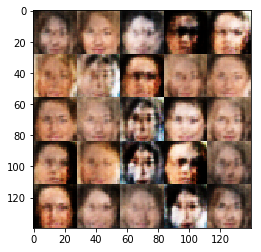

Epoch 1/1... Discriminator Loss: 0.8143... Generator Loss: 0.8880
Epoch 1/1... Discriminator Loss: 0.4608... Generator Loss: 1.9687
Epoch 1/1... Discriminator Loss: 0.6399... Generator Loss: 1.1208
Epoch 1/1... Discriminator Loss: 0.7161... Generator Loss: 0.7745
Epoch 1/1... Discriminator Loss: 0.3182... Generator Loss: 1.9050
Epoch 1/1... Discriminator Loss: 0.4656... Generator Loss: 1.7693
Epoch 1/1... Discriminator Loss: 0.2717... Generator Loss: 1.9797
Epoch 1/1... Discriminator Loss: 0.2722... Generator Loss: 2.1370
Epoch 1/1... Discriminator Loss: 0.4888... Generator Loss: 1.3251
Epoch 1/1... Discriminator Loss: 0.5754... Generator Loss: 1.1347


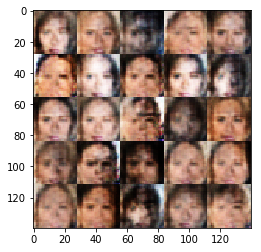

Epoch 1/1... Discriminator Loss: 0.6552... Generator Loss: 1.3119
Epoch 1/1... Discriminator Loss: 0.3183... Generator Loss: 4.4100
Epoch 1/1... Discriminator Loss: 0.3839... Generator Loss: 1.8337
Epoch 1/1... Discriminator Loss: 0.4578... Generator Loss: 1.4622
Epoch 1/1... Discriminator Loss: 0.6017... Generator Loss: 2.2177
Epoch 1/1... Discriminator Loss: 0.1977... Generator Loss: 2.6383
Epoch 1/1... Discriminator Loss: 0.5706... Generator Loss: 1.7557
Epoch 1/1... Discriminator Loss: 0.5598... Generator Loss: 1.3013
Epoch 1/1... Discriminator Loss: 0.9650... Generator Loss: 0.9098
Epoch 1/1... Discriminator Loss: 0.2923... Generator Loss: 3.1527


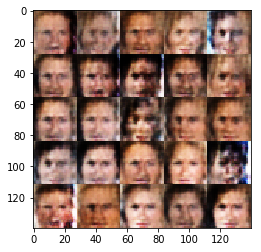

Epoch 1/1... Discriminator Loss: 0.6945... Generator Loss: 1.1238
Epoch 1/1... Discriminator Loss: 0.5693... Generator Loss: 1.0537
Epoch 1/1... Discriminator Loss: 0.3461... Generator Loss: 2.0996
Epoch 1/1... Discriminator Loss: 0.1992... Generator Loss: 2.3351
Epoch 1/1... Discriminator Loss: 1.5801... Generator Loss: 0.2636
Epoch 1/1... Discriminator Loss: 0.7303... Generator Loss: 2.2118
Epoch 1/1... Discriminator Loss: 0.3220... Generator Loss: 2.2049
Epoch 1/1... Discriminator Loss: 0.9204... Generator Loss: 0.6760
Epoch 1/1... Discriminator Loss: 0.6805... Generator Loss: 2.1202
Epoch 1/1... Discriminator Loss: 1.3058... Generator Loss: 0.4088


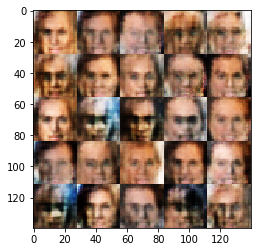

Epoch 1/1... Discriminator Loss: 1.6869... Generator Loss: 0.3131
Epoch 1/1... Discriminator Loss: 0.5915... Generator Loss: 1.4347
Epoch 1/1... Discriminator Loss: 0.3581... Generator Loss: 2.2323
Epoch 1/1... Discriminator Loss: 0.2135... Generator Loss: 3.2989
Epoch 1/1... Discriminator Loss: 0.5261... Generator Loss: 1.3407
Epoch 1/1... Discriminator Loss: 1.5565... Generator Loss: 0.2834
Epoch 1/1... Discriminator Loss: 0.8024... Generator Loss: 1.0133
Epoch 1/1... Discriminator Loss: 0.3090... Generator Loss: 2.0749
Epoch 1/1... Discriminator Loss: 0.5058... Generator Loss: 1.2461
Epoch 1/1... Discriminator Loss: 0.1584... Generator Loss: 3.5587


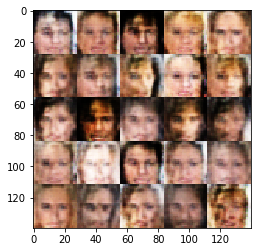

Epoch 1/1... Discriminator Loss: 0.4565... Generator Loss: 1.4634
Epoch 1/1... Discriminator Loss: 0.8360... Generator Loss: 0.8865
Epoch 1/1... Discriminator Loss: 0.3601... Generator Loss: 1.7538
Epoch 1/1... Discriminator Loss: 0.1022... Generator Loss: 4.3742
Epoch 1/1... Discriminator Loss: 0.7549... Generator Loss: 1.0133
Epoch 1/1... Discriminator Loss: 1.7691... Generator Loss: 0.2239
Epoch 1/1... Discriminator Loss: 0.8475... Generator Loss: 1.0165
Epoch 1/1... Discriminator Loss: 1.2149... Generator Loss: 3.4282
Epoch 1/1... Discriminator Loss: 0.1667... Generator Loss: 2.5871
Epoch 1/1... Discriminator Loss: 0.6382... Generator Loss: 2.0791


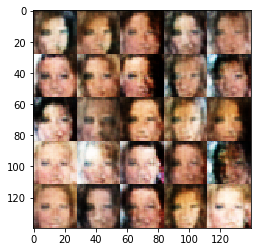

Epoch 1/1... Discriminator Loss: 1.0624... Generator Loss: 0.7560
Epoch 1/1... Discriminator Loss: 0.8175... Generator Loss: 0.8680
Epoch 1/1... Discriminator Loss: 0.2903... Generator Loss: 3.2186
Epoch 1/1... Discriminator Loss: 0.2727... Generator Loss: 2.2697
Epoch 1/1... Discriminator Loss: 0.3789... Generator Loss: 2.4746
Epoch 1/1... Discriminator Loss: 0.8118... Generator Loss: 0.8436
Epoch 1/1... Discriminator Loss: 0.3191... Generator Loss: 2.2001
Epoch 1/1... Discriminator Loss: 0.9316... Generator Loss: 0.6540
Epoch 1/1... Discriminator Loss: 0.6211... Generator Loss: 1.2859
Epoch 1/1... Discriminator Loss: 0.3722... Generator Loss: 2.2783


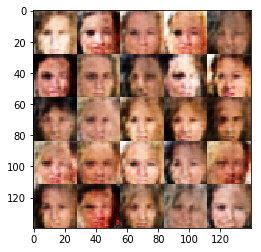

Epoch 1/1... Discriminator Loss: 0.7736... Generator Loss: 1.8625
Epoch 1/1... Discriminator Loss: 0.6244... Generator Loss: 1.1400
Epoch 1/1... Discriminator Loss: 0.2076... Generator Loss: 2.7546
Epoch 1/1... Discriminator Loss: 1.1524... Generator Loss: 0.5400
Epoch 1/1... Discriminator Loss: 0.6031... Generator Loss: 1.5628
Epoch 1/1... Discriminator Loss: 0.6263... Generator Loss: 1.2522
Epoch 1/1... Discriminator Loss: 0.5344... Generator Loss: 1.3117
Epoch 1/1... Discriminator Loss: 0.2830... Generator Loss: 2.0004
Epoch 1/1... Discriminator Loss: 0.7293... Generator Loss: 0.9085
Epoch 1/1... Discriminator Loss: 0.2883... Generator Loss: 2.1414


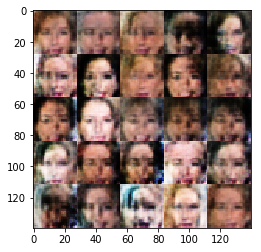

Epoch 1/1... Discriminator Loss: 0.4052... Generator Loss: 2.4297
Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 1.8625
Epoch 1/1... Discriminator Loss: 0.2895... Generator Loss: 2.2402
Epoch 1/1... Discriminator Loss: 0.4331... Generator Loss: 2.2742
Epoch 1/1... Discriminator Loss: 0.2190... Generator Loss: 3.0254
Epoch 1/1... Discriminator Loss: 1.2738... Generator Loss: 3.2364
Epoch 1/1... Discriminator Loss: 0.5406... Generator Loss: 2.4801
Epoch 1/1... Discriminator Loss: 0.5877... Generator Loss: 1.5287
Epoch 1/1... Discriminator Loss: 0.9841... Generator Loss: 1.8389
Epoch 1/1... Discriminator Loss: 0.3885... Generator Loss: 1.9581


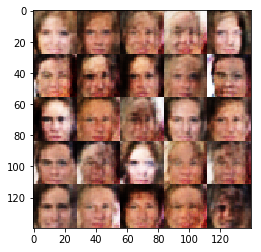

Epoch 1/1... Discriminator Loss: 0.3832... Generator Loss: 2.3723
Epoch 1/1... Discriminator Loss: 1.4843... Generator Loss: 0.3334
Epoch 1/1... Discriminator Loss: 0.6130... Generator Loss: 1.1848
Epoch 1/1... Discriminator Loss: 0.9261... Generator Loss: 1.3133
Epoch 1/1... Discriminator Loss: 0.3986... Generator Loss: 1.8404
Epoch 1/1... Discriminator Loss: 1.5536... Generator Loss: 0.3438
Epoch 1/1... Discriminator Loss: 1.2234... Generator Loss: 2.1023
Epoch 1/1... Discriminator Loss: 0.4492... Generator Loss: 1.3423
Epoch 1/1... Discriminator Loss: 0.3381... Generator Loss: 2.7827
Epoch 1/1... Discriminator Loss: 0.2056... Generator Loss: 2.8625


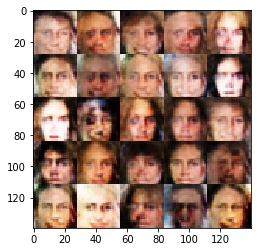

Epoch 1/1... Discriminator Loss: 0.9588... Generator Loss: 3.5605
Epoch 1/1... Discriminator Loss: 0.6361... Generator Loss: 1.5120
Epoch 1/1... Discriminator Loss: 0.3243... Generator Loss: 2.0775
Epoch 1/1... Discriminator Loss: 0.8540... Generator Loss: 1.2122
Epoch 1/1... Discriminator Loss: 0.9597... Generator Loss: 0.8535
Epoch 1/1... Discriminator Loss: 0.5572... Generator Loss: 1.3088
Epoch 1/1... Discriminator Loss: 0.5044... Generator Loss: 2.1581
Epoch 1/1... Discriminator Loss: 0.8948... Generator Loss: 1.4465
Epoch 1/1... Discriminator Loss: 0.7344... Generator Loss: 1.0376
Epoch 1/1... Discriminator Loss: 1.0233... Generator Loss: 0.7234


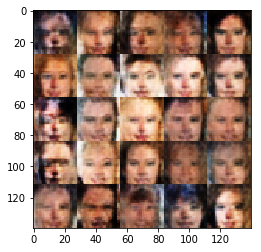

Epoch 1/1... Discriminator Loss: 0.5184... Generator Loss: 1.5452
Epoch 1/1... Discriminator Loss: 0.6132... Generator Loss: 1.3242
Epoch 1/1... Discriminator Loss: 0.7061... Generator Loss: 0.9457
Epoch 1/1... Discriminator Loss: 0.8939... Generator Loss: 1.0837
Epoch 1/1... Discriminator Loss: 0.6115... Generator Loss: 1.2195
Epoch 1/1... Discriminator Loss: 0.3670... Generator Loss: 2.1623
Epoch 1/1... Discriminator Loss: 0.9520... Generator Loss: 0.6701
Epoch 1/1... Discriminator Loss: 0.5277... Generator Loss: 1.1870
Epoch 1/1... Discriminator Loss: 1.8410... Generator Loss: 0.2371
Epoch 1/1... Discriminator Loss: 0.3447... Generator Loss: 1.5723


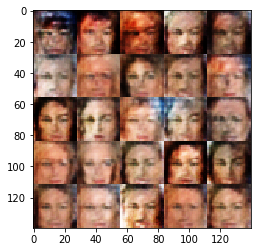

Epoch 1/1... Discriminator Loss: 0.6705... Generator Loss: 1.0259
Epoch 1/1... Discriminator Loss: 0.8092... Generator Loss: 0.8493
Epoch 1/1... Discriminator Loss: 0.9152... Generator Loss: 0.7208
Epoch 1/1... Discriminator Loss: 0.5192... Generator Loss: 1.4511
Epoch 1/1... Discriminator Loss: 0.5753... Generator Loss: 1.4402
Epoch 1/1... Discriminator Loss: 0.3862... Generator Loss: 2.2768
Epoch 1/1... Discriminator Loss: 0.7865... Generator Loss: 0.7581
Epoch 1/1... Discriminator Loss: 0.9317... Generator Loss: 1.3719
Epoch 1/1... Discriminator Loss: 0.8220... Generator Loss: 0.8034
Epoch 1/1... Discriminator Loss: 0.7539... Generator Loss: 1.0285


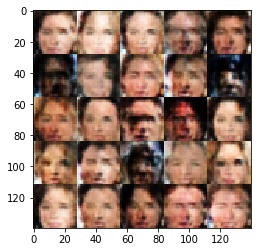

Epoch 1/1... Discriminator Loss: 0.4743... Generator Loss: 1.5186
Epoch 1/1... Discriminator Loss: 0.1802... Generator Loss: 2.6865
Epoch 1/1... Discriminator Loss: 0.7630... Generator Loss: 1.1172
Epoch 1/1... Discriminator Loss: 0.6075... Generator Loss: 1.5093
Epoch 1/1... Discriminator Loss: 0.3687... Generator Loss: 2.4154
Epoch 1/1... Discriminator Loss: 0.9402... Generator Loss: 0.7188
Epoch 1/1... Discriminator Loss: 0.3372... Generator Loss: 2.3193
Epoch 1/1... Discriminator Loss: 0.7344... Generator Loss: 0.8714
Epoch 1/1... Discriminator Loss: 0.3677... Generator Loss: 1.4647
Epoch 1/1... Discriminator Loss: 0.5988... Generator Loss: 1.5821


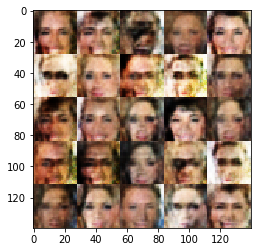

Epoch 1/1... Discriminator Loss: 0.3837... Generator Loss: 1.9458
Epoch 1/1... Discriminator Loss: 0.7291... Generator Loss: 0.9507
Epoch 1/1... Discriminator Loss: 0.7830... Generator Loss: 2.0727
Epoch 1/1... Discriminator Loss: 0.6794... Generator Loss: 1.1521
Epoch 1/1... Discriminator Loss: 0.6803... Generator Loss: 1.5906
Epoch 1/1... Discriminator Loss: 0.8070... Generator Loss: 0.9244
Epoch 1/1... Discriminator Loss: 0.5599... Generator Loss: 1.4573
Epoch 1/1... Discriminator Loss: 1.0086... Generator Loss: 0.5604
Epoch 1/1... Discriminator Loss: 0.9869... Generator Loss: 0.6805
Epoch 1/1... Discriminator Loss: 0.9995... Generator Loss: 2.8408


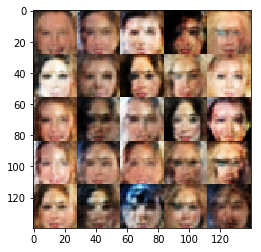

Epoch 1/1... Discriminator Loss: 0.6403... Generator Loss: 1.1410
Epoch 1/1... Discriminator Loss: 0.4412... Generator Loss: 1.5119
Epoch 1/1... Discriminator Loss: 0.6060... Generator Loss: 1.1670
Epoch 1/1... Discriminator Loss: 0.5265... Generator Loss: 1.2961
Epoch 1/1... Discriminator Loss: 1.3586... Generator Loss: 0.4058
Epoch 1/1... Discriminator Loss: 0.7762... Generator Loss: 1.3190
Epoch 1/1... Discriminator Loss: 0.6636... Generator Loss: 2.3017
Epoch 1/1... Discriminator Loss: 0.5147... Generator Loss: 1.4224
Epoch 1/1... Discriminator Loss: 0.3086... Generator Loss: 2.9557
Epoch 1/1... Discriminator Loss: 0.6171... Generator Loss: 1.6288


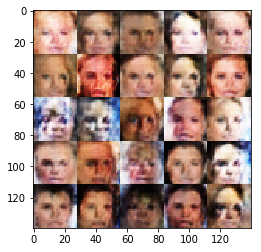

Epoch 1/1... Discriminator Loss: 0.2129... Generator Loss: 2.0314
Epoch 1/1... Discriminator Loss: 0.4566... Generator Loss: 1.3807
Epoch 1/1... Discriminator Loss: 0.9531... Generator Loss: 0.7292
Epoch 1/1... Discriminator Loss: 0.2168... Generator Loss: 2.6690
Epoch 1/1... Discriminator Loss: 1.2717... Generator Loss: 3.7404
Epoch 1/1... Discriminator Loss: 0.4656... Generator Loss: 1.7284
Epoch 1/1... Discriminator Loss: 0.5753... Generator Loss: 1.2738
Epoch 1/1... Discriminator Loss: 0.4598... Generator Loss: 1.4957
Epoch 1/1... Discriminator Loss: 0.9656... Generator Loss: 0.6892
Epoch 1/1... Discriminator Loss: 0.5943... Generator Loss: 1.0661


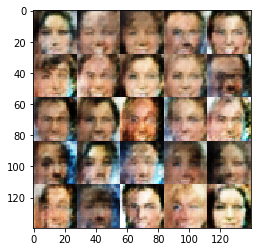

Epoch 1/1... Discriminator Loss: 0.5322... Generator Loss: 1.3364
Epoch 1/1... Discriminator Loss: 0.5620... Generator Loss: 2.1472
Epoch 1/1... Discriminator Loss: 1.2903... Generator Loss: 0.4685
Epoch 1/1... Discriminator Loss: 0.7622... Generator Loss: 0.8165
Epoch 1/1... Discriminator Loss: 0.5596... Generator Loss: 1.1307
Epoch 1/1... Discriminator Loss: 0.9602... Generator Loss: 0.7963
Epoch 1/1... Discriminator Loss: 1.4284... Generator Loss: 0.3988
Epoch 1/1... Discriminator Loss: 1.0005... Generator Loss: 1.3498
Epoch 1/1... Discriminator Loss: 0.4866... Generator Loss: 1.2886
Epoch 1/1... Discriminator Loss: 0.6626... Generator Loss: 2.4909


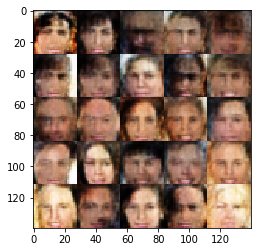

Epoch 1/1... Discriminator Loss: 0.4764... Generator Loss: 1.4770
Epoch 1/1... Discriminator Loss: 0.4782... Generator Loss: 1.4135
Epoch 1/1... Discriminator Loss: 0.8521... Generator Loss: 0.9917
Epoch 1/1... Discriminator Loss: 0.4316... Generator Loss: 1.5568
Epoch 1/1... Discriminator Loss: 1.0987... Generator Loss: 0.5044
Epoch 1/1... Discriminator Loss: 0.7584... Generator Loss: 1.0500
Epoch 1/1... Discriminator Loss: 0.7935... Generator Loss: 0.9225
Epoch 1/1... Discriminator Loss: 0.4829... Generator Loss: 1.4591
Epoch 1/1... Discriminator Loss: 0.6248... Generator Loss: 1.5465
Epoch 1/1... Discriminator Loss: 0.4380... Generator Loss: 1.8589


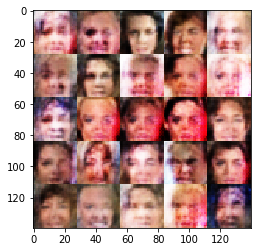

Epoch 1/1... Discriminator Loss: 0.8832... Generator Loss: 1.9973
Epoch 1/1... Discriminator Loss: 0.5909... Generator Loss: 1.2110
Epoch 1/1... Discriminator Loss: 1.3371... Generator Loss: 0.3737
Epoch 1/1... Discriminator Loss: 1.1273... Generator Loss: 0.6350
Epoch 1/1... Discriminator Loss: 0.6764... Generator Loss: 1.6482
Epoch 1/1... Discriminator Loss: 0.3985... Generator Loss: 2.2529
Epoch 1/1... Discriminator Loss: 0.5787... Generator Loss: 1.1659
Epoch 1/1... Discriminator Loss: 0.5555... Generator Loss: 1.8555
Epoch 1/1... Discriminator Loss: 0.6544... Generator Loss: 2.1418
Epoch 1/1... Discriminator Loss: 0.5934... Generator Loss: 1.4068


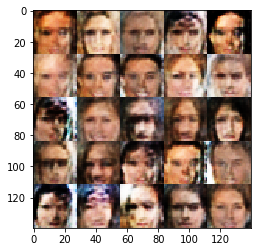

Epoch 1/1... Discriminator Loss: 0.5002... Generator Loss: 1.6746
Epoch 1/1... Discriminator Loss: 0.8053... Generator Loss: 1.2602
Epoch 1/1... Discriminator Loss: 0.7332... Generator Loss: 1.4500
Epoch 1/1... Discriminator Loss: 0.5207... Generator Loss: 1.3308
Epoch 1/1... Discriminator Loss: 0.6928... Generator Loss: 2.4227
Epoch 1/1... Discriminator Loss: 0.4621... Generator Loss: 2.1829
Epoch 1/1... Discriminator Loss: 0.6075... Generator Loss: 1.4966
Epoch 1/1... Discriminator Loss: 0.5248... Generator Loss: 1.4754
Epoch 1/1... Discriminator Loss: 1.4431... Generator Loss: 0.4693
Epoch 1/1... Discriminator Loss: 0.5508... Generator Loss: 2.1580


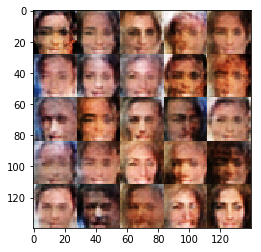

Epoch 1/1... Discriminator Loss: 0.7063... Generator Loss: 0.9678
Epoch 1/1... Discriminator Loss: 0.6788... Generator Loss: 2.8267
Epoch 1/1... Discriminator Loss: 0.7595... Generator Loss: 1.3116
Epoch 1/1... Discriminator Loss: 0.6359... Generator Loss: 1.1824
Epoch 1/1... Discriminator Loss: 0.4865... Generator Loss: 1.2938
Epoch 1/1... Discriminator Loss: 0.6049... Generator Loss: 1.4704
Epoch 1/1... Discriminator Loss: 0.5461... Generator Loss: 1.4605
Epoch 1/1... Discriminator Loss: 1.3020... Generator Loss: 0.4070
Epoch 1/1... Discriminator Loss: 0.7657... Generator Loss: 0.9275
Epoch 1/1... Discriminator Loss: 0.8061... Generator Loss: 1.1601


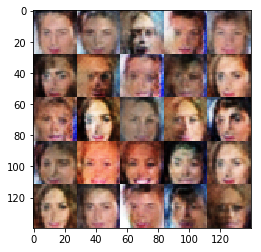

Epoch 1/1... Discriminator Loss: 0.5186... Generator Loss: 2.5158
Epoch 1/1... Discriminator Loss: 0.3264... Generator Loss: 2.0790
Epoch 1/1... Discriminator Loss: 0.8848... Generator Loss: 0.9870
Epoch 1/1... Discriminator Loss: 0.8026... Generator Loss: 1.1324
Epoch 1/1... Discriminator Loss: 0.6192... Generator Loss: 1.3219
Epoch 1/1... Discriminator Loss: 0.5892... Generator Loss: 1.8367
Epoch 1/1... Discriminator Loss: 0.8797... Generator Loss: 1.0479
Epoch 1/1... Discriminator Loss: 0.5411... Generator Loss: 1.6258
Epoch 1/1... Discriminator Loss: 0.2637... Generator Loss: 2.5713
Epoch 1/1... Discriminator Loss: 0.6966... Generator Loss: 2.9160


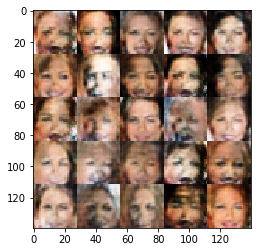

Epoch 1/1... Discriminator Loss: 0.6261... Generator Loss: 1.4780
Epoch 1/1... Discriminator Loss: 0.6020... Generator Loss: 1.6697
Epoch 1/1... Discriminator Loss: 0.8502... Generator Loss: 0.8068
Epoch 1/1... Discriminator Loss: 0.4124... Generator Loss: 1.6997
Epoch 1/1... Discriminator Loss: 0.8713... Generator Loss: 0.7356
Epoch 1/1... Discriminator Loss: 0.4827... Generator Loss: 1.6181
Epoch 1/1... Discriminator Loss: 0.8075... Generator Loss: 1.1689
Epoch 1/1... Discriminator Loss: 0.5883... Generator Loss: 1.7186
Epoch 1/1... Discriminator Loss: 0.5574... Generator Loss: 1.1754
Epoch 1/1... Discriminator Loss: 0.7709... Generator Loss: 1.0411


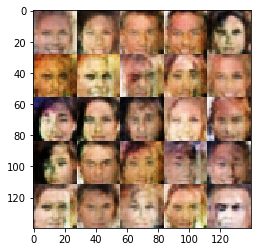

Epoch 1/1... Discriminator Loss: 0.5029... Generator Loss: 1.5015
Epoch 1/1... Discriminator Loss: 0.4536... Generator Loss: 1.5492
Epoch 1/1... Discriminator Loss: 0.5499... Generator Loss: 1.0971
Epoch 1/1... Discriminator Loss: 0.5048... Generator Loss: 1.3883
Epoch 1/1... Discriminator Loss: 1.7206... Generator Loss: 0.3119
Epoch 1/1... Discriminator Loss: 0.7444... Generator Loss: 1.6634
Epoch 1/1... Discriminator Loss: 0.3710... Generator Loss: 2.0488
Epoch 1/1... Discriminator Loss: 0.6496... Generator Loss: 1.4698
Epoch 1/1... Discriminator Loss: 0.2584... Generator Loss: 2.5753
Epoch 1/1... Discriminator Loss: 0.7901... Generator Loss: 2.2868


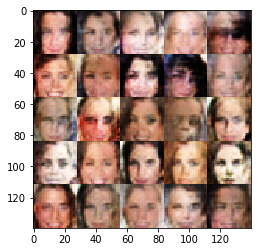

Epoch 1/1... Discriminator Loss: 0.9538... Generator Loss: 0.7428
Epoch 1/1... Discriminator Loss: 0.3758... Generator Loss: 1.7493
Epoch 1/1... Discriminator Loss: 0.8218... Generator Loss: 2.4215
Epoch 1/1... Discriminator Loss: 0.9567... Generator Loss: 0.8343
Epoch 1/1... Discriminator Loss: 0.7767... Generator Loss: 1.1105
Epoch 1/1... Discriminator Loss: 0.6966... Generator Loss: 1.1310
Epoch 1/1... Discriminator Loss: 0.7399... Generator Loss: 0.9874
Epoch 1/1... Discriminator Loss: 0.7622... Generator Loss: 0.9877
Epoch 1/1... Discriminator Loss: 1.0246... Generator Loss: 0.5524
Epoch 1/1... Discriminator Loss: 0.7297... Generator Loss: 1.4553


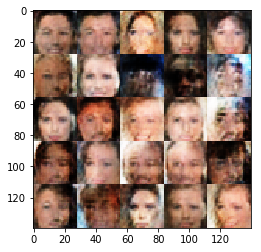

Epoch 1/1... Discriminator Loss: 0.9069... Generator Loss: 0.8935
Epoch 1/1... Discriminator Loss: 0.8538... Generator Loss: 1.0566
Epoch 1/1... Discriminator Loss: 0.6735... Generator Loss: 1.8730
Epoch 1/1... Discriminator Loss: 0.6857... Generator Loss: 0.9980
Epoch 1/1... Discriminator Loss: 0.4592... Generator Loss: 1.9280
Epoch 1/1... Discriminator Loss: 0.9687... Generator Loss: 0.6961
Epoch 1/1... Discriminator Loss: 1.0077... Generator Loss: 0.7050
Epoch 1/1... Discriminator Loss: 0.7447... Generator Loss: 1.4136
Epoch 1/1... Discriminator Loss: 0.7766... Generator Loss: 1.4718
Epoch 1/1... Discriminator Loss: 0.8055... Generator Loss: 0.9565


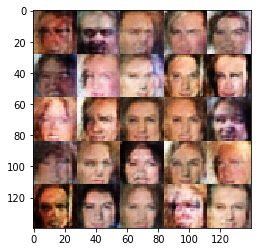

Epoch 1/1... Discriminator Loss: 1.0887... Generator Loss: 0.9563
Epoch 1/1... Discriminator Loss: 0.9080... Generator Loss: 0.8906
Epoch 1/1... Discriminator Loss: 0.9344... Generator Loss: 0.9355
Epoch 1/1... Discriminator Loss: 0.6610... Generator Loss: 1.3645
Epoch 1/1... Discriminator Loss: 0.7078... Generator Loss: 0.9652
Epoch 1/1... Discriminator Loss: 1.4391... Generator Loss: 0.4141
Epoch 1/1... Discriminator Loss: 0.3735... Generator Loss: 2.4803
Epoch 1/1... Discriminator Loss: 1.0486... Generator Loss: 0.6370
Epoch 1/1... Discriminator Loss: 0.8252... Generator Loss: 1.2693
Epoch 1/1... Discriminator Loss: 0.3664... Generator Loss: 2.4975


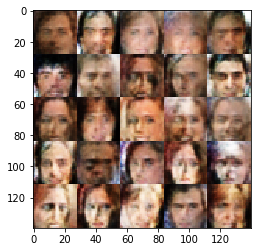

Epoch 1/1... Discriminator Loss: 1.1546... Generator Loss: 0.6039
Epoch 1/1... Discriminator Loss: 0.6622... Generator Loss: 1.4753
Epoch 1/1... Discriminator Loss: 0.7777... Generator Loss: 1.0301
Epoch 1/1... Discriminator Loss: 0.4213... Generator Loss: 1.5739
Epoch 1/1... Discriminator Loss: 0.8209... Generator Loss: 0.9482
Epoch 1/1... Discriminator Loss: 0.9176... Generator Loss: 0.7329
Epoch 1/1... Discriminator Loss: 0.5989... Generator Loss: 1.4318
Epoch 1/1... Discriminator Loss: 0.3491... Generator Loss: 1.7418
Epoch 1/1... Discriminator Loss: 1.0038... Generator Loss: 0.7497
Epoch 1/1... Discriminator Loss: 0.7605... Generator Loss: 0.8672


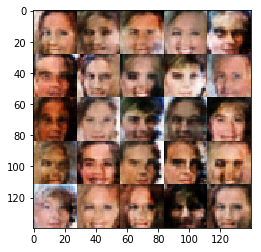

Epoch 1/1... Discriminator Loss: 0.9868... Generator Loss: 0.6538
Epoch 1/1... Discriminator Loss: 1.1388... Generator Loss: 0.5577
Epoch 1/1... Discriminator Loss: 0.9025... Generator Loss: 1.0435
Epoch 1/1... Discriminator Loss: 0.5648... Generator Loss: 2.1888
Epoch 1/1... Discriminator Loss: 0.5989... Generator Loss: 1.0427
Epoch 1/1... Discriminator Loss: 0.4609... Generator Loss: 1.7821
Epoch 1/1... Discriminator Loss: 0.8426... Generator Loss: 0.7415
Epoch 1/1... Discriminator Loss: 0.4801... Generator Loss: 1.6262
Epoch 1/1... Discriminator Loss: 0.5123... Generator Loss: 1.2012
Epoch 1/1... Discriminator Loss: 1.0508... Generator Loss: 1.3095


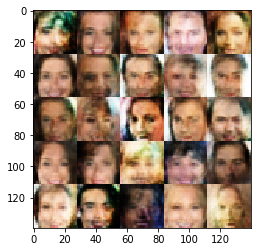

Epoch 1/1... Discriminator Loss: 0.8125... Generator Loss: 0.9905
Epoch 1/1... Discriminator Loss: 0.8863... Generator Loss: 1.1849
Epoch 1/1... Discriminator Loss: 0.7721... Generator Loss: 1.0110
Epoch 1/1... Discriminator Loss: 0.4066... Generator Loss: 1.8212
Epoch 1/1... Discriminator Loss: 0.8727... Generator Loss: 0.8213
Epoch 1/1... Discriminator Loss: 1.0577... Generator Loss: 0.5847
Epoch 1/1... Discriminator Loss: 0.5785... Generator Loss: 1.2795
Epoch 1/1... Discriminator Loss: 0.2191... Generator Loss: 2.9149
Epoch 1/1... Discriminator Loss: 0.3005... Generator Loss: 1.9397
Epoch 1/1... Discriminator Loss: 0.4449... Generator Loss: 1.8036


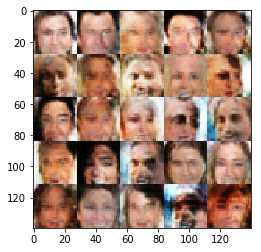

Epoch 1/1... Discriminator Loss: 0.9482... Generator Loss: 0.9307
Epoch 1/1... Discriminator Loss: 0.9494... Generator Loss: 0.6401
Epoch 1/1... Discriminator Loss: 1.1700... Generator Loss: 0.4459
Epoch 1/1... Discriminator Loss: 0.5418... Generator Loss: 2.4047
Epoch 1/1... Discriminator Loss: 0.8102... Generator Loss: 0.8644
Epoch 1/1... Discriminator Loss: 0.9422... Generator Loss: 0.6880
Epoch 1/1... Discriminator Loss: 0.6748... Generator Loss: 1.1344
Epoch 1/1... Discriminator Loss: 0.8064... Generator Loss: 0.9670
Epoch 1/1... Discriminator Loss: 0.6168... Generator Loss: 1.0553
Epoch 1/1... Discriminator Loss: 0.7336... Generator Loss: 1.1631


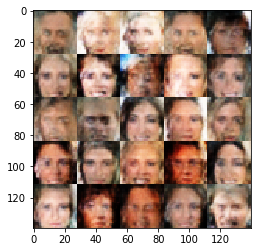

Epoch 1/1... Discriminator Loss: 0.6857... Generator Loss: 1.2830
Epoch 1/1... Discriminator Loss: 1.5829... Generator Loss: 0.3678
Epoch 1/1... Discriminator Loss: 0.8468... Generator Loss: 1.7113
Epoch 1/1... Discriminator Loss: 0.7053... Generator Loss: 0.9008
Epoch 1/1... Discriminator Loss: 0.6145... Generator Loss: 1.8262
Epoch 1/1... Discriminator Loss: 0.6304... Generator Loss: 1.1064
Epoch 1/1... Discriminator Loss: 1.4151... Generator Loss: 0.3778
Epoch 1/1... Discriminator Loss: 0.5879... Generator Loss: 1.3040
Epoch 1/1... Discriminator Loss: 0.6123... Generator Loss: 0.9707
Epoch 1/1... Discriminator Loss: 0.6886... Generator Loss: 1.3477


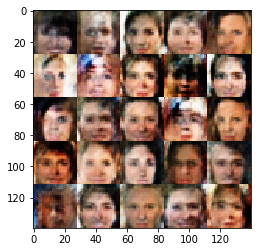

Epoch 1/1... Discriminator Loss: 0.7360... Generator Loss: 1.3148
Epoch 1/1... Discriminator Loss: 0.4637... Generator Loss: 1.4915
Epoch 1/1... Discriminator Loss: 0.5945... Generator Loss: 1.3870
Epoch 1/1... Discriminator Loss: 0.3965... Generator Loss: 2.2723
Epoch 1/1... Discriminator Loss: 1.0899... Generator Loss: 0.6182
Epoch 1/1... Discriminator Loss: 0.8168... Generator Loss: 1.3271
Epoch 1/1... Discriminator Loss: 0.5198... Generator Loss: 2.8271
Epoch 1/1... Discriminator Loss: 0.5090... Generator Loss: 1.7669
Epoch 1/1... Discriminator Loss: 1.2249... Generator Loss: 0.4436
Epoch 1/1... Discriminator Loss: 0.4242... Generator Loss: 2.5969


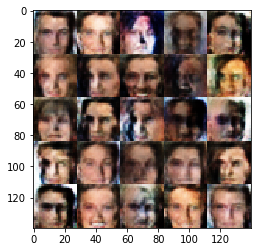

Epoch 1/1... Discriminator Loss: 0.6702... Generator Loss: 1.2193
Epoch 1/1... Discriminator Loss: 0.4760... Generator Loss: 1.9385
Epoch 1/1... Discriminator Loss: 0.6992... Generator Loss: 1.1148
Epoch 1/1... Discriminator Loss: 1.0257... Generator Loss: 0.5510
Epoch 1/1... Discriminator Loss: 0.7510... Generator Loss: 1.7210
Epoch 1/1... Discriminator Loss: 0.7820... Generator Loss: 0.9996
Epoch 1/1... Discriminator Loss: 0.4814... Generator Loss: 1.4775
Epoch 1/1... Discriminator Loss: 0.4768... Generator Loss: 1.5018
Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.3403
Epoch 1/1... Discriminator Loss: 0.8855... Generator Loss: 0.6913


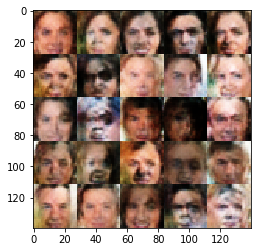

Epoch 1/1... Discriminator Loss: 0.8938... Generator Loss: 1.1039
Epoch 1/1... Discriminator Loss: 0.6969... Generator Loss: 1.2927
Epoch 1/1... Discriminator Loss: 0.7983... Generator Loss: 0.8360
Epoch 1/1... Discriminator Loss: 1.0707... Generator Loss: 1.5212
Epoch 1/1... Discriminator Loss: 0.6117... Generator Loss: 1.2625
Epoch 1/1... Discriminator Loss: 0.9955... Generator Loss: 0.6622
Epoch 1/1... Discriminator Loss: 0.9356... Generator Loss: 0.8052
Epoch 1/1... Discriminator Loss: 0.5002... Generator Loss: 1.4456
Epoch 1/1... Discriminator Loss: 1.3248... Generator Loss: 0.3816
Epoch 1/1... Discriminator Loss: 0.9231... Generator Loss: 0.6780


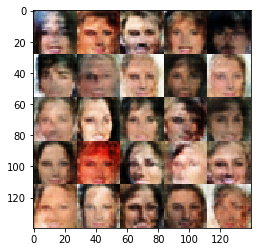

Epoch 1/1... Discriminator Loss: 0.7723... Generator Loss: 1.1913
Epoch 1/1... Discriminator Loss: 0.6789... Generator Loss: 1.0562
Epoch 1/1... Discriminator Loss: 0.8798... Generator Loss: 1.3847
Epoch 1/1... Discriminator Loss: 0.6528... Generator Loss: 1.1843
Epoch 1/1... Discriminator Loss: 0.8978... Generator Loss: 1.2666
Epoch 1/1... Discriminator Loss: 0.7762... Generator Loss: 0.8842
Epoch 1/1... Discriminator Loss: 0.7555... Generator Loss: 1.5884
Epoch 1/1... Discriminator Loss: 0.3748... Generator Loss: 1.8017
Epoch 1/1... Discriminator Loss: 1.1377... Generator Loss: 0.5364
Epoch 1/1... Discriminator Loss: 0.5828... Generator Loss: 1.9029


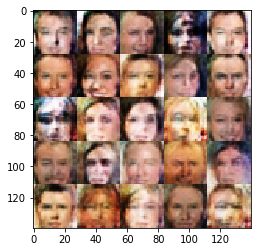

Epoch 1/1... Discriminator Loss: 0.8540... Generator Loss: 0.7478
Epoch 1/1... Discriminator Loss: 0.5062... Generator Loss: 2.2977
Epoch 1/1... Discriminator Loss: 0.9560... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 0.5223... Generator Loss: 1.6005
Epoch 1/1... Discriminator Loss: 0.9403... Generator Loss: 1.4160
Epoch 1/1... Discriminator Loss: 0.8766... Generator Loss: 0.8283
Epoch 1/1... Discriminator Loss: 0.5934... Generator Loss: 1.1357
Epoch 1/1... Discriminator Loss: 0.4449... Generator Loss: 1.8140
Epoch 1/1... Discriminator Loss: 0.5412... Generator Loss: 1.4283
Epoch 1/1... Discriminator Loss: 0.7353... Generator Loss: 0.9123


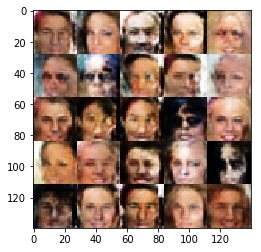

Epoch 1/1... Discriminator Loss: 0.4190... Generator Loss: 1.5276
Epoch 1/1... Discriminator Loss: 0.7302... Generator Loss: 1.5631
Epoch 1/1... Discriminator Loss: 0.7659... Generator Loss: 1.0122
Epoch 1/1... Discriminator Loss: 0.6623... Generator Loss: 1.0588
Epoch 1/1... Discriminator Loss: 1.2122... Generator Loss: 0.5233
Epoch 1/1... Discriminator Loss: 0.8292... Generator Loss: 0.9242
Epoch 1/1... Discriminator Loss: 0.8052... Generator Loss: 1.1134
Epoch 1/1... Discriminator Loss: 0.6697... Generator Loss: 2.0348
Epoch 1/1... Discriminator Loss: 0.9666... Generator Loss: 1.4393
Epoch 1/1... Discriminator Loss: 0.7811... Generator Loss: 1.0425


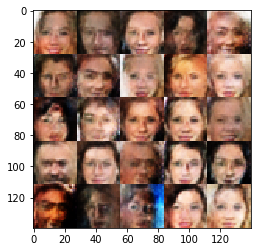

Epoch 1/1... Discriminator Loss: 0.5829... Generator Loss: 1.2673
Epoch 1/1... Discriminator Loss: 0.4642... Generator Loss: 1.5493
Epoch 1/1... Discriminator Loss: 0.3528... Generator Loss: 2.6886
Epoch 1/1... Discriminator Loss: 1.1127... Generator Loss: 0.7292
Epoch 1/1... Discriminator Loss: 0.8569... Generator Loss: 0.8204
Epoch 1/1... Discriminator Loss: 0.7893... Generator Loss: 0.9526
Epoch 1/1... Discriminator Loss: 0.9595... Generator Loss: 0.8118
Epoch 1/1... Discriminator Loss: 1.0536... Generator Loss: 0.8048
Epoch 1/1... Discriminator Loss: 0.9477... Generator Loss: 0.6111
Epoch 1/1... Discriminator Loss: 1.0557... Generator Loss: 0.6308


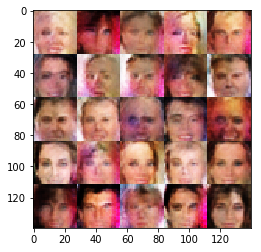

Epoch 1/1... Discriminator Loss: 0.5962... Generator Loss: 1.2387
Epoch 1/1... Discriminator Loss: 1.6259... Generator Loss: 0.2730
Epoch 1/1... Discriminator Loss: 0.5718... Generator Loss: 1.4317
Epoch 1/1... Discriminator Loss: 0.4036... Generator Loss: 1.4950
Epoch 1/1... Discriminator Loss: 1.0509... Generator Loss: 0.7386
Epoch 1/1... Discriminator Loss: 0.7043... Generator Loss: 0.9399
Epoch 1/1... Discriminator Loss: 0.3887... Generator Loss: 2.2294
Epoch 1/1... Discriminator Loss: 0.7590... Generator Loss: 1.4298
Epoch 1/1... Discriminator Loss: 0.4648... Generator Loss: 1.8624
Epoch 1/1... Discriminator Loss: 0.7050... Generator Loss: 1.1149


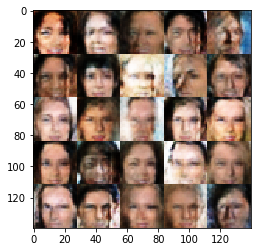

Epoch 1/1... Discriminator Loss: 0.6250... Generator Loss: 1.2242
Epoch 1/1... Discriminator Loss: 0.5852... Generator Loss: 1.2661
Epoch 1/1... Discriminator Loss: 0.9334... Generator Loss: 0.7404
Epoch 1/1... Discriminator Loss: 0.6058... Generator Loss: 1.9252
Epoch 1/1... Discriminator Loss: 1.1069... Generator Loss: 0.5920
Epoch 1/1... Discriminator Loss: 0.3683... Generator Loss: 2.6943
Epoch 1/1... Discriminator Loss: 0.7321... Generator Loss: 1.6729
Epoch 1/1... Discriminator Loss: 0.8019... Generator Loss: 0.9872
Epoch 1/1... Discriminator Loss: 0.6665... Generator Loss: 1.5139
Epoch 1/1... Discriminator Loss: 0.5560... Generator Loss: 1.2625


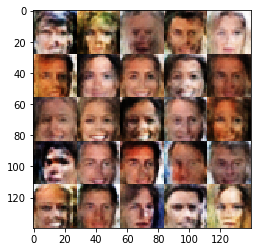

Epoch 1/1... Discriminator Loss: 1.4065... Generator Loss: 0.4147
Epoch 1/1... Discriminator Loss: 0.5024... Generator Loss: 1.9166
Epoch 1/1... Discriminator Loss: 0.5724... Generator Loss: 1.3292
Epoch 1/1... Discriminator Loss: 0.6575... Generator Loss: 1.6828
Epoch 1/1... Discriminator Loss: 0.7258... Generator Loss: 1.1312
Epoch 1/1... Discriminator Loss: 1.2730... Generator Loss: 0.3764
Epoch 1/1... Discriminator Loss: 0.7953... Generator Loss: 0.9603
Epoch 1/1... Discriminator Loss: 0.5559... Generator Loss: 1.5778
Epoch 1/1... Discriminator Loss: 0.7188... Generator Loss: 1.3245
Epoch 1/1... Discriminator Loss: 0.7153... Generator Loss: 1.1243


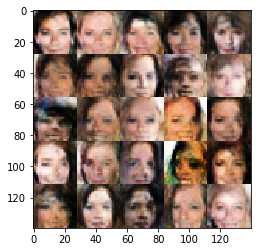

Epoch 1/1... Discriminator Loss: 0.8740... Generator Loss: 0.8157
Epoch 1/1... Discriminator Loss: 0.4726... Generator Loss: 1.6261
Epoch 1/1... Discriminator Loss: 0.7933... Generator Loss: 1.0291
Epoch 1/1... Discriminator Loss: 1.1020... Generator Loss: 0.6019
Epoch 1/1... Discriminator Loss: 0.8568... Generator Loss: 1.5169
Epoch 1/1... Discriminator Loss: 1.0609... Generator Loss: 0.5861
Epoch 1/1... Discriminator Loss: 1.1838... Generator Loss: 0.4910
Epoch 1/1... Discriminator Loss: 0.9842... Generator Loss: 0.6199
Epoch 1/1... Discriminator Loss: 0.5415... Generator Loss: 1.1765
Epoch 1/1... Discriminator Loss: 1.0209... Generator Loss: 0.7619


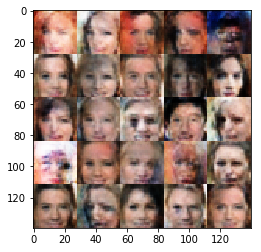

Epoch 1/1... Discriminator Loss: 0.9552... Generator Loss: 0.7084
Epoch 1/1... Discriminator Loss: 1.2998... Generator Loss: 0.3837
Epoch 1/1... Discriminator Loss: 0.9138... Generator Loss: 0.7950
Epoch 1/1... Discriminator Loss: 0.6945... Generator Loss: 1.0992
Epoch 1/1... Discriminator Loss: 0.5807... Generator Loss: 1.5201
Epoch 1/1... Discriminator Loss: 0.6441... Generator Loss: 1.0188
Epoch 1/1... Discriminator Loss: 0.7242... Generator Loss: 1.5441
Epoch 1/1... Discriminator Loss: 0.7294... Generator Loss: 1.0451
Epoch 1/1... Discriminator Loss: 0.8150... Generator Loss: 0.8022
Epoch 1/1... Discriminator Loss: 0.4212... Generator Loss: 2.2377


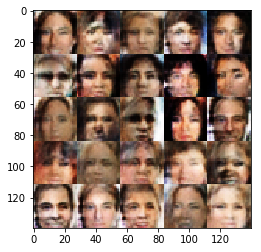

Epoch 1/1... Discriminator Loss: 0.3518... Generator Loss: 1.8668
Epoch 1/1... Discriminator Loss: 0.8978... Generator Loss: 0.7774
Epoch 1/1... Discriminator Loss: 0.5752... Generator Loss: 2.3016
Epoch 1/1... Discriminator Loss: 1.7405... Generator Loss: 2.8752
Epoch 1/1... Discriminator Loss: 0.5706... Generator Loss: 1.2839
Epoch 1/1... Discriminator Loss: 0.7244... Generator Loss: 1.0459
Epoch 1/1... Discriminator Loss: 0.5422... Generator Loss: 1.2965
Epoch 1/1... Discriminator Loss: 0.8394... Generator Loss: 0.8942
Epoch 1/1... Discriminator Loss: 0.9992... Generator Loss: 0.6961
Epoch 1/1... Discriminator Loss: 0.9866... Generator Loss: 0.8961


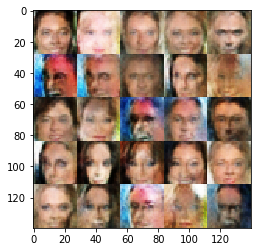

Epoch 1/1... Discriminator Loss: 0.7867... Generator Loss: 0.9610
Epoch 1/1... Discriminator Loss: 0.4069... Generator Loss: 1.9054
Epoch 1/1... Discriminator Loss: 0.3178... Generator Loss: 3.3161
Epoch 1/1... Discriminator Loss: 0.8018... Generator Loss: 1.1256
Epoch 1/1... Discriminator Loss: 0.5175... Generator Loss: 1.7710
Epoch 1/1... Discriminator Loss: 0.9032... Generator Loss: 1.0571
Epoch 1/1... Discriminator Loss: 0.7082... Generator Loss: 1.1406
Epoch 1/1... Discriminator Loss: 0.2502... Generator Loss: 1.9783
Epoch 1/1... Discriminator Loss: 0.6305... Generator Loss: 1.6691
Epoch 1/1... Discriminator Loss: 0.6920... Generator Loss: 0.9511


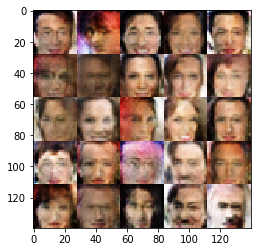

Epoch 1/1... Discriminator Loss: 1.0044... Generator Loss: 0.6980
Epoch 1/1... Discriminator Loss: 0.8764... Generator Loss: 0.7987
Epoch 1/1... Discriminator Loss: 0.9274... Generator Loss: 0.6015
Epoch 1/1... Discriminator Loss: 0.8503... Generator Loss: 1.1321
Epoch 1/1... Discriminator Loss: 0.8552... Generator Loss: 0.8137
Epoch 1/1... Discriminator Loss: 1.1104... Generator Loss: 0.5363
Epoch 1/1... Discriminator Loss: 0.9986... Generator Loss: 0.7880
Epoch 1/1... Discriminator Loss: 1.0039... Generator Loss: 0.7031
Epoch 1/1... Discriminator Loss: 1.0958... Generator Loss: 0.9448
Epoch 1/1... Discriminator Loss: 1.4877... Generator Loss: 0.3982


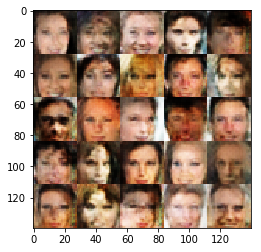

Epoch 1/1... Discriminator Loss: 0.8157... Generator Loss: 1.2971
Epoch 1/1... Discriminator Loss: 0.6834... Generator Loss: 1.1033
Epoch 1/1... Discriminator Loss: 0.8559... Generator Loss: 0.9685
Epoch 1/1... Discriminator Loss: 0.9358... Generator Loss: 0.6862
Epoch 1/1... Discriminator Loss: 0.6663... Generator Loss: 1.2763
Epoch 1/1... Discriminator Loss: 0.3321... Generator Loss: 1.8976
Epoch 1/1... Discriminator Loss: 0.3725... Generator Loss: 1.6610
Epoch 1/1... Discriminator Loss: 0.7805... Generator Loss: 0.9747
Epoch 1/1... Discriminator Loss: 0.2969... Generator Loss: 2.4806
Epoch 1/1... Discriminator Loss: 0.7148... Generator Loss: 1.0112


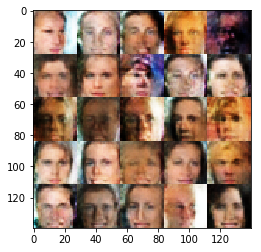

Epoch 1/1... Discriminator Loss: 0.8495... Generator Loss: 0.8781
Epoch 1/1... Discriminator Loss: 1.8304... Generator Loss: 0.2086
Epoch 1/1... Discriminator Loss: 0.8426... Generator Loss: 0.9945
Epoch 1/1... Discriminator Loss: 0.5940... Generator Loss: 1.4715
Epoch 1/1... Discriminator Loss: 0.9684... Generator Loss: 1.4154
Epoch 1/1... Discriminator Loss: 0.6611... Generator Loss: 1.4136
Epoch 1/1... Discriminator Loss: 0.6807... Generator Loss: 1.2029
Epoch 1/1... Discriminator Loss: 0.8903... Generator Loss: 0.7515
Epoch 1/1... Discriminator Loss: 0.6378... Generator Loss: 1.3536
Epoch 1/1... Discriminator Loss: 0.8871... Generator Loss: 0.9576


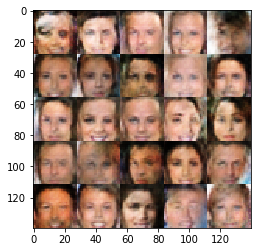

Epoch 1/1... Discriminator Loss: 1.4942... Generator Loss: 0.4430
Epoch 1/1... Discriminator Loss: 0.6957... Generator Loss: 1.5133
Epoch 1/1... Discriminator Loss: 0.7942... Generator Loss: 1.0090
Epoch 1/1... Discriminator Loss: 0.3307... Generator Loss: 1.8278
Epoch 1/1... Discriminator Loss: 0.6815... Generator Loss: 1.3010
Epoch 1/1... Discriminator Loss: 1.1568... Generator Loss: 1.3633
Epoch 1/1... Discriminator Loss: 0.6387... Generator Loss: 1.9258
Epoch 1/1... Discriminator Loss: 0.7492... Generator Loss: 0.9546
Epoch 1/1... Discriminator Loss: 0.7474... Generator Loss: 1.0040
Epoch 1/1... Discriminator Loss: 0.3982... Generator Loss: 1.7076


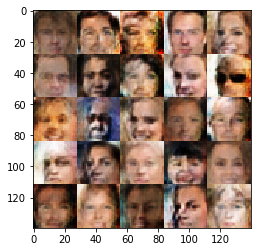

Epoch 1/1... Discriminator Loss: 0.9547... Generator Loss: 0.8031
Epoch 1/1... Discriminator Loss: 0.8043... Generator Loss: 1.3310
Epoch 1/1... Discriminator Loss: 1.1233... Generator Loss: 0.5694
Epoch 1/1... Discriminator Loss: 0.7790... Generator Loss: 0.8025
Epoch 1/1... Discriminator Loss: 0.2946... Generator Loss: 2.3923
Epoch 1/1... Discriminator Loss: 0.3095... Generator Loss: 2.4809
Epoch 1/1... Discriminator Loss: 0.8461... Generator Loss: 0.9837
Epoch 1/1... Discriminator Loss: 0.8398... Generator Loss: 0.8340
Epoch 1/1... Discriminator Loss: 0.9133... Generator Loss: 0.8380
Epoch 1/1... Discriminator Loss: 0.4763... Generator Loss: 1.7979


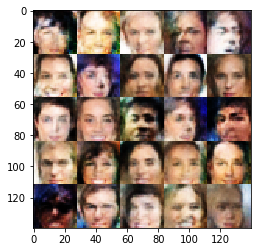

Epoch 1/1... Discriminator Loss: 0.9800... Generator Loss: 0.7140
Epoch 1/1... Discriminator Loss: 1.1151... Generator Loss: 0.8596
Epoch 1/1... Discriminator Loss: 0.7336... Generator Loss: 1.1273
Epoch 1/1... Discriminator Loss: 0.9902... Generator Loss: 0.6733
Epoch 1/1... Discriminator Loss: 0.5976... Generator Loss: 1.4343
Epoch 1/1... Discriminator Loss: 0.9225... Generator Loss: 0.7472
Epoch 1/1... Discriminator Loss: 1.0473... Generator Loss: 0.6296
Epoch 1/1... Discriminator Loss: 0.6091... Generator Loss: 1.3536
Epoch 1/1... Discriminator Loss: 0.8066... Generator Loss: 0.9931
Epoch 1/1... Discriminator Loss: 0.8673... Generator Loss: 1.4255


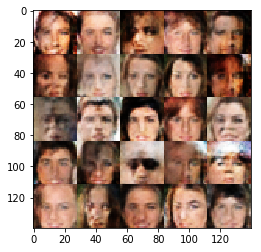

Epoch 1/1... Discriminator Loss: 0.8943... Generator Loss: 0.7038
Epoch 1/1... Discriminator Loss: 0.9556... Generator Loss: 0.6539
Epoch 1/1... Discriminator Loss: 0.4811... Generator Loss: 1.7188
Epoch 1/1... Discriminator Loss: 0.6383... Generator Loss: 1.6977
Epoch 1/1... Discriminator Loss: 0.9664... Generator Loss: 0.9380
Epoch 1/1... Discriminator Loss: 0.6217... Generator Loss: 1.1093
Epoch 1/1... Discriminator Loss: 0.7997... Generator Loss: 0.9868
Epoch 1/1... Discriminator Loss: 0.4969... Generator Loss: 1.8689
Epoch 1/1... Discriminator Loss: 0.6273... Generator Loss: 1.1892
Epoch 1/1... Discriminator Loss: 0.5539... Generator Loss: 1.3579


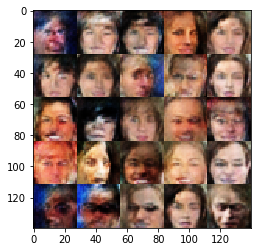

Epoch 1/1... Discriminator Loss: 0.7770... Generator Loss: 0.9511
Epoch 1/1... Discriminator Loss: 0.9296... Generator Loss: 0.7584
Epoch 1/1... Discriminator Loss: 0.5935... Generator Loss: 1.3536
Epoch 1/1... Discriminator Loss: 0.5595... Generator Loss: 1.3094
Epoch 1/1... Discriminator Loss: 0.8471... Generator Loss: 0.8972
Epoch 1/1... Discriminator Loss: 0.5924... Generator Loss: 1.3297
Epoch 1/1... Discriminator Loss: 0.5109... Generator Loss: 1.2218
Epoch 1/1... Discriminator Loss: 0.7998... Generator Loss: 1.8845
Epoch 1/1... Discriminator Loss: 1.2958... Generator Loss: 0.4396
Epoch 1/1... Discriminator Loss: 1.0829... Generator Loss: 0.5510


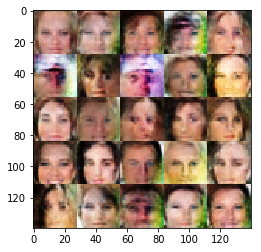

Epoch 1/1... Discriminator Loss: 1.6321... Generator Loss: 0.2811
Epoch 1/1... Discriminator Loss: 1.1437... Generator Loss: 0.5363
Epoch 1/1... Discriminator Loss: 0.7798... Generator Loss: 0.8688
Epoch 1/1... Discriminator Loss: 0.9237... Generator Loss: 0.8020
Epoch 1/1... Discriminator Loss: 0.8783... Generator Loss: 0.9622
Epoch 1/1... Discriminator Loss: 0.8857... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 1.2136... Generator Loss: 0.6221
Epoch 1/1... Discriminator Loss: 1.2805... Generator Loss: 0.4206
Epoch 1/1... Discriminator Loss: 0.6502... Generator Loss: 0.9633
Epoch 1/1... Discriminator Loss: 0.3511... Generator Loss: 1.7661


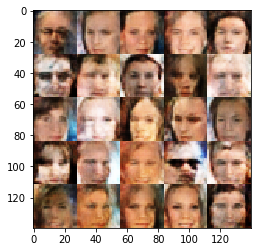

Epoch 1/1... Discriminator Loss: 0.6294... Generator Loss: 1.9812
Epoch 1/1... Discriminator Loss: 1.2218... Generator Loss: 0.4710
Epoch 1/1... Discriminator Loss: 0.7628... Generator Loss: 1.0571
Epoch 1/1... Discriminator Loss: 0.6766... Generator Loss: 0.9641
Epoch 1/1... Discriminator Loss: 0.7618... Generator Loss: 0.8662
Epoch 1/1... Discriminator Loss: 0.4897... Generator Loss: 1.3181
Epoch 1/1... Discriminator Loss: 0.8811... Generator Loss: 0.7521
Epoch 1/1... Discriminator Loss: 0.1014... Generator Loss: 3.7968
Epoch 1/1... Discriminator Loss: 0.7307... Generator Loss: 1.0563
Epoch 1/1... Discriminator Loss: 0.5892... Generator Loss: 1.2903


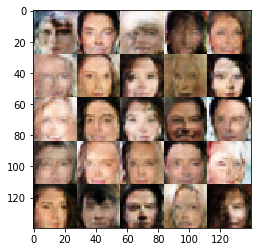

Epoch 1/1... Discriminator Loss: 1.6965... Generator Loss: 0.3128
Epoch 1/1... Discriminator Loss: 0.7793... Generator Loss: 1.3187
Epoch 1/1... Discriminator Loss: 0.8492... Generator Loss: 0.8415
Epoch 1/1... Discriminator Loss: 0.8071... Generator Loss: 1.0989
Epoch 1/1... Discriminator Loss: 1.3700... Generator Loss: 0.4604
Epoch 1/1... Discriminator Loss: 0.8287... Generator Loss: 0.7787
Epoch 1/1... Discriminator Loss: 0.8445... Generator Loss: 1.2666
Epoch 1/1... Discriminator Loss: 1.1375... Generator Loss: 0.6070
Epoch 1/1... Discriminator Loss: 0.6632... Generator Loss: 1.0890
Epoch 1/1... Discriminator Loss: 0.6651... Generator Loss: 1.2371


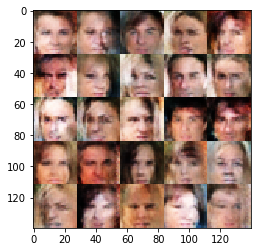

Epoch 1/1... Discriminator Loss: 1.0923... Generator Loss: 0.5783
Epoch 1/1... Discriminator Loss: 0.6558... Generator Loss: 1.1051
Epoch 1/1... Discriminator Loss: 0.9380... Generator Loss: 0.9687
Epoch 1/1... Discriminator Loss: 1.4809... Generator Loss: 0.3725
Epoch 1/1... Discriminator Loss: 0.7590... Generator Loss: 0.9286
Epoch 1/1... Discriminator Loss: 0.8452... Generator Loss: 0.9902
Epoch 1/1... Discriminator Loss: 0.5638... Generator Loss: 1.1863
Epoch 1/1... Discriminator Loss: 0.7020... Generator Loss: 1.0254
Epoch 1/1... Discriminator Loss: 0.9662... Generator Loss: 1.7717
Epoch 1/1... Discriminator Loss: 0.7596... Generator Loss: 0.9646


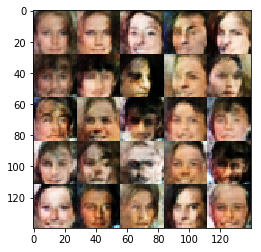

Epoch 1/1... Discriminator Loss: 0.6884... Generator Loss: 1.4095
Epoch 1/1... Discriminator Loss: 0.1874... Generator Loss: 2.2608
Epoch 1/1... Discriminator Loss: 1.0758... Generator Loss: 0.6428
Epoch 1/1... Discriminator Loss: 0.9441... Generator Loss: 0.7804
Epoch 1/1... Discriminator Loss: 0.6779... Generator Loss: 1.0356
Epoch 1/1... Discriminator Loss: 0.8941... Generator Loss: 1.1223
Epoch 1/1... Discriminator Loss: 0.8585... Generator Loss: 0.9568
Epoch 1/1... Discriminator Loss: 0.6394... Generator Loss: 1.3117
Epoch 1/1... Discriminator Loss: 0.7515... Generator Loss: 0.9927
Epoch 1/1... Discriminator Loss: 0.6262... Generator Loss: 1.1011


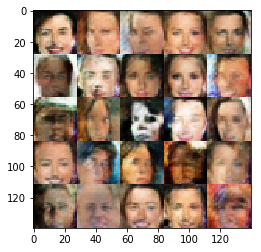

Epoch 1/1... Discriminator Loss: 0.8060... Generator Loss: 1.0501
Epoch 1/1... Discriminator Loss: 0.6308... Generator Loss: 1.2320
Epoch 1/1... Discriminator Loss: 1.2751... Generator Loss: 2.4961
Epoch 1/1... Discriminator Loss: 1.1340... Generator Loss: 0.6156
Epoch 1/1... Discriminator Loss: 0.4582... Generator Loss: 1.8319
Epoch 1/1... Discriminator Loss: 0.6916... Generator Loss: 1.3879
Epoch 1/1... Discriminator Loss: 1.0255... Generator Loss: 0.6775
Epoch 1/1... Discriminator Loss: 0.9156... Generator Loss: 1.1765
Epoch 1/1... Discriminator Loss: 0.8811... Generator Loss: 0.9143
Epoch 1/1... Discriminator Loss: 1.1272... Generator Loss: 0.6042


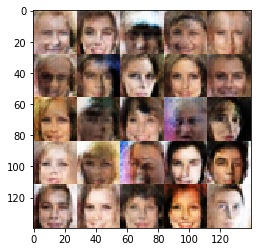

Epoch 1/1... Discriminator Loss: 1.5521... Generator Loss: 0.2968
Epoch 1/1... Discriminator Loss: 1.2270... Generator Loss: 0.6562
Epoch 1/1... Discriminator Loss: 0.7856... Generator Loss: 1.0733
Epoch 1/1... Discriminator Loss: 0.5253... Generator Loss: 1.7366
Epoch 1/1... Discriminator Loss: 0.5657... Generator Loss: 1.1557
Epoch 1/1... Discriminator Loss: 1.1128... Generator Loss: 0.5757
Epoch 1/1... Discriminator Loss: 0.6845... Generator Loss: 1.1586
Epoch 1/1... Discriminator Loss: 0.4836... Generator Loss: 1.4649
Epoch 1/1... Discriminator Loss: 1.1025... Generator Loss: 0.5436
Epoch 1/1... Discriminator Loss: 1.0342... Generator Loss: 0.6786


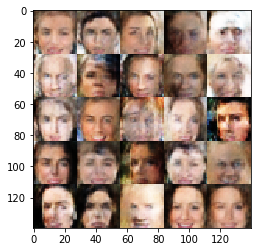

Epoch 1/1... Discriminator Loss: 0.8734... Generator Loss: 0.8865
Epoch 1/1... Discriminator Loss: 1.0793... Generator Loss: 0.8443
Epoch 1/1... Discriminator Loss: 0.6964... Generator Loss: 1.0691
Epoch 1/1... Discriminator Loss: 0.6396... Generator Loss: 1.2390
Epoch 1/1... Discriminator Loss: 0.7377... Generator Loss: 0.8844
Epoch 1/1... Discriminator Loss: 0.7966... Generator Loss: 1.1374
Epoch 1/1... Discriminator Loss: 1.4420... Generator Loss: 0.4031
Epoch 1/1... Discriminator Loss: 1.1241... Generator Loss: 0.5720
Epoch 1/1... Discriminator Loss: 0.6968... Generator Loss: 1.2542
Epoch 1/1... Discriminator Loss: 0.5413... Generator Loss: 1.5861


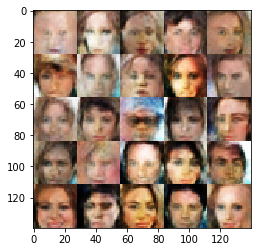

Epoch 1/1... Discriminator Loss: 1.0116... Generator Loss: 0.9407
Epoch 1/1... Discriminator Loss: 0.6530... Generator Loss: 1.4915
Epoch 1/1... Discriminator Loss: 0.8334... Generator Loss: 1.0241
Epoch 1/1... Discriminator Loss: 0.4370... Generator Loss: 1.6249
Epoch 1/1... Discriminator Loss: 0.4677... Generator Loss: 2.1315
Epoch 1/1... Discriminator Loss: 0.6168... Generator Loss: 1.3090
Epoch 1/1... Discriminator Loss: 0.1403... Generator Loss: 3.4112
Epoch 1/1... Discriminator Loss: 0.7580... Generator Loss: 1.0986
Epoch 1/1... Discriminator Loss: 0.7176... Generator Loss: 0.9815
Epoch 1/1... Discriminator Loss: 0.6072... Generator Loss: 1.2644


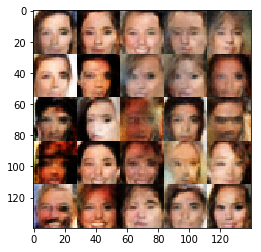

Epoch 1/1... Discriminator Loss: 1.0415... Generator Loss: 0.9119
Epoch 1/1... Discriminator Loss: 1.0541... Generator Loss: 2.1448
Epoch 1/1... Discriminator Loss: 0.8721... Generator Loss: 1.0970
Epoch 1/1... Discriminator Loss: 0.9062... Generator Loss: 1.3825
Epoch 1/1... Discriminator Loss: 1.2524... Generator Loss: 0.5999
Epoch 1/1... Discriminator Loss: 0.8702... Generator Loss: 0.7385
Epoch 1/1... Discriminator Loss: 0.7100... Generator Loss: 1.1384
Epoch 1/1... Discriminator Loss: 0.6304... Generator Loss: 1.8174
Epoch 1/1... Discriminator Loss: 0.9902... Generator Loss: 0.6645
Epoch 1/1... Discriminator Loss: 0.9093... Generator Loss: 0.7792


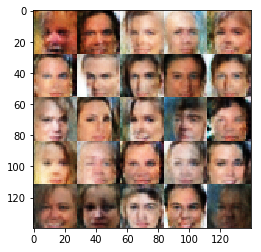

Epoch 1/1... Discriminator Loss: 1.1520... Generator Loss: 0.8689
Epoch 1/1... Discriminator Loss: 0.7331... Generator Loss: 1.1799
Epoch 1/1... Discriminator Loss: 0.7415... Generator Loss: 1.2677
Epoch 1/1... Discriminator Loss: 0.7277... Generator Loss: 1.0389
Epoch 1/1... Discriminator Loss: 1.0617... Generator Loss: 0.6454
Epoch 1/1... Discriminator Loss: 0.9845... Generator Loss: 0.8537
Epoch 1/1... Discriminator Loss: 1.0570... Generator Loss: 0.6109
Epoch 1/1... Discriminator Loss: 1.2990... Generator Loss: 0.4570
Epoch 1/1... Discriminator Loss: 0.8126... Generator Loss: 0.9126
Epoch 1/1... Discriminator Loss: 0.6952... Generator Loss: 1.0427


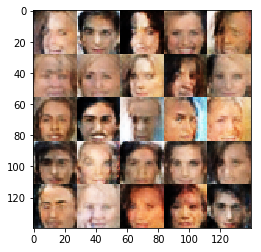

Epoch 1/1... Discriminator Loss: 1.0072... Generator Loss: 1.9078
Epoch 1/1... Discriminator Loss: 1.0002... Generator Loss: 1.0171
Epoch 1/1... Discriminator Loss: 1.0624... Generator Loss: 0.6643
Epoch 1/1... Discriminator Loss: 0.8630... Generator Loss: 1.0520
Epoch 1/1... Discriminator Loss: 0.8413... Generator Loss: 0.9929
Epoch 1/1... Discriminator Loss: 0.4612... Generator Loss: 1.5048
Epoch 1/1... Discriminator Loss: 1.1228... Generator Loss: 0.6351
Epoch 1/1... Discriminator Loss: 1.0940... Generator Loss: 1.6584
Epoch 1/1... Discriminator Loss: 0.5649... Generator Loss: 1.4060
Epoch 1/1... Discriminator Loss: 0.7507... Generator Loss: 0.8708


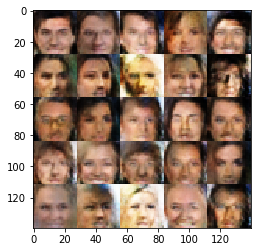

Epoch 1/1... Discriminator Loss: 0.4751... Generator Loss: 1.5637
Epoch 1/1... Discriminator Loss: 0.9862... Generator Loss: 0.7093
Epoch 1/1... Discriminator Loss: 0.9248... Generator Loss: 0.7821
Epoch 1/1... Discriminator Loss: 0.9433... Generator Loss: 0.9757
Epoch 1/1... Discriminator Loss: 1.0288... Generator Loss: 0.5718
Epoch 1/1... Discriminator Loss: 0.6814... Generator Loss: 1.0054
Epoch 1/1... Discriminator Loss: 1.2128... Generator Loss: 0.5212
Epoch 1/1... Discriminator Loss: 0.5243... Generator Loss: 1.5868
Epoch 1/1... Discriminator Loss: 0.7627... Generator Loss: 1.1321
Epoch 1/1... Discriminator Loss: 1.0024... Generator Loss: 0.7027


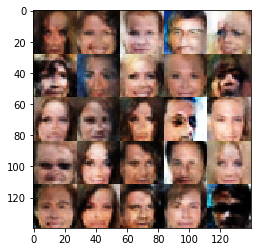

Epoch 1/1... Discriminator Loss: 1.1390... Generator Loss: 0.5663
Epoch 1/1... Discriminator Loss: 1.2469... Generator Loss: 0.5416
Epoch 1/1... Discriminator Loss: 0.6057... Generator Loss: 1.2493
Epoch 1/1... Discriminator Loss: 1.2988... Generator Loss: 0.4666
Epoch 1/1... Discriminator Loss: 1.4118... Generator Loss: 0.4252
Epoch 1/1... Discriminator Loss: 0.3326... Generator Loss: 2.0160
Epoch 1/1... Discriminator Loss: 0.6541... Generator Loss: 1.5457
Epoch 1/1... Discriminator Loss: 0.9525... Generator Loss: 0.7945
Epoch 1/1... Discriminator Loss: 1.0592... Generator Loss: 0.6000
Epoch 1/1... Discriminator Loss: 0.7034... Generator Loss: 1.0820


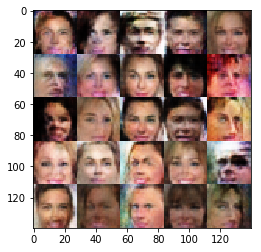

Epoch 1/1... Discriminator Loss: 0.8666... Generator Loss: 0.7241
Epoch 1/1... Discriminator Loss: 1.0467... Generator Loss: 0.8452
Epoch 1/1... Discriminator Loss: 0.7654... Generator Loss: 0.9598
Epoch 1/1... Discriminator Loss: 0.6822... Generator Loss: 1.2346
Epoch 1/1... Discriminator Loss: 1.0284... Generator Loss: 0.7343
Epoch 1/1... Discriminator Loss: 1.5447... Generator Loss: 0.2979
Epoch 1/1... Discriminator Loss: 0.7713... Generator Loss: 1.0653
Epoch 1/1... Discriminator Loss: 0.7922... Generator Loss: 1.0435
Epoch 1/1... Discriminator Loss: 1.0669... Generator Loss: 0.6000
Epoch 1/1... Discriminator Loss: 0.9171... Generator Loss: 0.7776


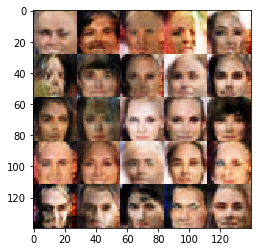

Epoch 1/1... Discriminator Loss: 0.8711... Generator Loss: 0.8969
Epoch 1/1... Discriminator Loss: 1.1995... Generator Loss: 0.4783
Epoch 1/1... Discriminator Loss: 0.7832... Generator Loss: 1.3153
Epoch 1/1... Discriminator Loss: 1.3038... Generator Loss: 0.9176
Epoch 1/1... Discriminator Loss: 0.5936... Generator Loss: 1.1506
Epoch 1/1... Discriminator Loss: 0.9059... Generator Loss: 1.1959
Epoch 1/1... Discriminator Loss: 0.9031... Generator Loss: 0.7956
Epoch 1/1... Discriminator Loss: 1.2058... Generator Loss: 0.5110
Epoch 1/1... Discriminator Loss: 0.9374... Generator Loss: 0.6786
Epoch 1/1... Discriminator Loss: 0.6884... Generator Loss: 1.2357


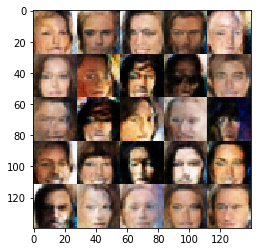

Epoch 1/1... Discriminator Loss: 1.5599... Generator Loss: 2.8673
Epoch 1/1... Discriminator Loss: 0.5617... Generator Loss: 1.6160
Epoch 1/1... Discriminator Loss: 1.0408... Generator Loss: 0.7515
Epoch 1/1... Discriminator Loss: 0.8080... Generator Loss: 0.8247
Epoch 1/1... Discriminator Loss: 0.7855... Generator Loss: 0.8906
Epoch 1/1... Discriminator Loss: 0.7185... Generator Loss: 0.9751
Epoch 1/1... Discriminator Loss: 0.8151... Generator Loss: 1.0050
Epoch 1/1... Discriminator Loss: 1.0230... Generator Loss: 0.6831
Epoch 1/1... Discriminator Loss: 0.5155... Generator Loss: 1.2650
Epoch 1/1... Discriminator Loss: 0.4670... Generator Loss: 1.2730


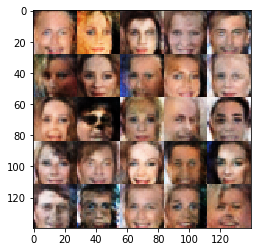

Epoch 1/1... Discriminator Loss: 0.6409... Generator Loss: 1.2483
Epoch 1/1... Discriminator Loss: 0.8745... Generator Loss: 1.2064
Epoch 1/1... Discriminator Loss: 0.8524... Generator Loss: 0.9329
Epoch 1/1... Discriminator Loss: 0.9689... Generator Loss: 0.8611
Epoch 1/1... Discriminator Loss: 0.6011... Generator Loss: 2.3049
Epoch 1/1... Discriminator Loss: 0.6858... Generator Loss: 1.2687
Epoch 1/1... Discriminator Loss: 0.8788... Generator Loss: 0.9018
Epoch 1/1... Discriminator Loss: 0.5782... Generator Loss: 1.4049
Epoch 1/1... Discriminator Loss: 1.0287... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 1.2989... Generator Loss: 0.4513


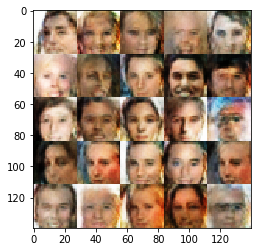

Epoch 1/1... Discriminator Loss: 0.8982... Generator Loss: 1.0942
Epoch 1/1... Discriminator Loss: 0.7554... Generator Loss: 0.9708
Epoch 1/1... Discriminator Loss: 0.6427... Generator Loss: 1.2482
Epoch 1/1... Discriminator Loss: 0.7797... Generator Loss: 0.9338
Epoch 1/1... Discriminator Loss: 1.2203... Generator Loss: 0.4959
Epoch 1/1... Discriminator Loss: 1.1204... Generator Loss: 0.5610
Epoch 1/1... Discriminator Loss: 0.9967... Generator Loss: 0.8550
Epoch 1/1... Discriminator Loss: 0.8988... Generator Loss: 0.8020
Epoch 1/1... Discriminator Loss: 1.5781... Generator Loss: 0.3269
Epoch 1/1... Discriminator Loss: 1.5529... Generator Loss: 0.6902


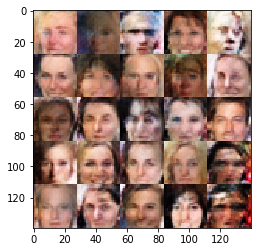

Epoch 1/1... Discriminator Loss: 0.8486... Generator Loss: 0.9999
Epoch 1/1... Discriminator Loss: 0.8018... Generator Loss: 0.9111
Epoch 1/1... Discriminator Loss: 1.3807... Generator Loss: 0.4423
Epoch 1/1... Discriminator Loss: 0.8134... Generator Loss: 0.8537
Epoch 1/1... Discriminator Loss: 1.1096... Generator Loss: 0.8488
Epoch 1/1... Discriminator Loss: 0.9210... Generator Loss: 0.6988
Epoch 1/1... Discriminator Loss: 0.8879... Generator Loss: 0.9689
Epoch 1/1... Discriminator Loss: 0.8916... Generator Loss: 0.8045
Epoch 1/1... Discriminator Loss: 1.0263... Generator Loss: 0.8051
Epoch 1/1... Discriminator Loss: 0.7908... Generator Loss: 1.0007


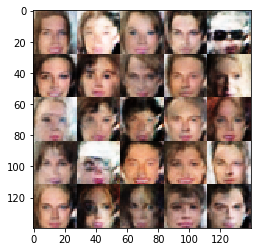

Epoch 1/1... Discriminator Loss: 1.0357... Generator Loss: 0.7235
Epoch 1/1... Discriminator Loss: 0.9751... Generator Loss: 0.8695
Epoch 1/1... Discriminator Loss: 0.8459... Generator Loss: 0.8447
Epoch 1/1... Discriminator Loss: 0.6360... Generator Loss: 1.8386
Epoch 1/1... Discriminator Loss: 0.8988... Generator Loss: 1.1910
Epoch 1/1... Discriminator Loss: 1.4192... Generator Loss: 0.4182
Epoch 1/1... Discriminator Loss: 0.6926... Generator Loss: 1.1164
Epoch 1/1... Discriminator Loss: 1.3396... Generator Loss: 0.6208
Epoch 1/1... Discriminator Loss: 0.8006... Generator Loss: 1.0841
Epoch 1/1... Discriminator Loss: 0.5470... Generator Loss: 1.4496


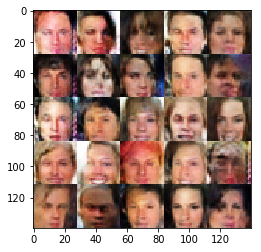

Epoch 1/1... Discriminator Loss: 1.0062... Generator Loss: 0.7850
Epoch 1/1... Discriminator Loss: 0.8168... Generator Loss: 0.9396
Epoch 1/1... Discriminator Loss: 1.0337... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 0.9393... Generator Loss: 0.6406
Epoch 1/1... Discriminator Loss: 0.9916... Generator Loss: 0.8247
Epoch 1/1... Discriminator Loss: 0.7677... Generator Loss: 1.0031
Epoch 1/1... Discriminator Loss: 0.6957... Generator Loss: 1.1847
Epoch 1/1... Discriminator Loss: 1.0738... Generator Loss: 0.7918
Epoch 1/1... Discriminator Loss: 0.9219... Generator Loss: 0.7679
Epoch 1/1... Discriminator Loss: 0.8996... Generator Loss: 0.9801


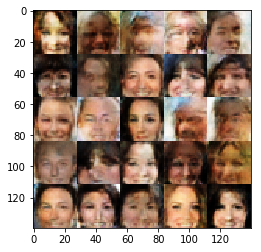

Epoch 1/1... Discriminator Loss: 0.9805... Generator Loss: 0.8789
Epoch 1/1... Discriminator Loss: 0.9528... Generator Loss: 0.7109
Epoch 1/1... Discriminator Loss: 0.9813... Generator Loss: 0.7453
Epoch 1/1... Discriminator Loss: 0.8406... Generator Loss: 1.8343
Epoch 1/1... Discriminator Loss: 0.8043... Generator Loss: 0.8417
Epoch 1/1... Discriminator Loss: 1.0165... Generator Loss: 0.6381
Epoch 1/1... Discriminator Loss: 0.7289... Generator Loss: 0.9191
Epoch 1/1... Discriminator Loss: 0.6973... Generator Loss: 1.3904
Epoch 1/1... Discriminator Loss: 0.6465... Generator Loss: 1.3934
Epoch 1/1... Discriminator Loss: 0.9304... Generator Loss: 1.3546


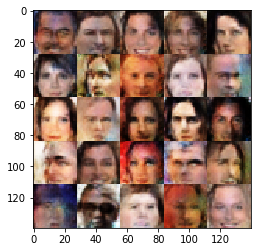

Epoch 1/1... Discriminator Loss: 0.6997... Generator Loss: 1.3437
Epoch 1/1... Discriminator Loss: 0.4651... Generator Loss: 1.4929
Epoch 1/1... Discriminator Loss: 0.7744... Generator Loss: 1.4050
Epoch 1/1... Discriminator Loss: 0.3723... Generator Loss: 2.3472
Epoch 1/1... Discriminator Loss: 0.5811... Generator Loss: 1.3093
Epoch 1/1... Discriminator Loss: 0.8783... Generator Loss: 0.8309
Epoch 1/1... Discriminator Loss: 1.0235... Generator Loss: 0.7354
Epoch 1/1... Discriminator Loss: 0.9929... Generator Loss: 0.9607
Epoch 1/1... Discriminator Loss: 1.0078... Generator Loss: 0.8868
Epoch 1/1... Discriminator Loss: 0.6131... Generator Loss: 1.0906


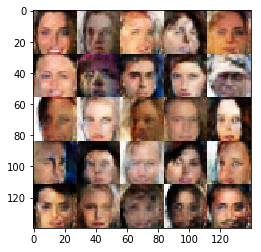

Epoch 1/1... Discriminator Loss: 0.8491... Generator Loss: 1.4890
Epoch 1/1... Discriminator Loss: 1.1425... Generator Loss: 0.5914
Epoch 1/1... Discriminator Loss: 0.9035... Generator Loss: 1.1495
Epoch 1/1... Discriminator Loss: 0.5398... Generator Loss: 1.2804
Epoch 1/1... Discriminator Loss: 0.6928... Generator Loss: 0.9480
Epoch 1/1... Discriminator Loss: 0.6870... Generator Loss: 1.1479
Epoch 1/1... Discriminator Loss: 1.0833... Generator Loss: 0.6734
Epoch 1/1... Discriminator Loss: 0.8158... Generator Loss: 0.8645
Epoch 1/1... Discriminator Loss: 0.5622... Generator Loss: 1.2407
Epoch 1/1... Discriminator Loss: 0.8028... Generator Loss: 0.8707


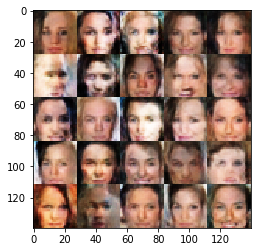

Epoch 1/1... Discriminator Loss: 0.8905... Generator Loss: 1.4770
Epoch 1/1... Discriminator Loss: 0.7003... Generator Loss: 1.7126
Epoch 1/1... Discriminator Loss: 0.6502... Generator Loss: 1.6451
Epoch 1/1... Discriminator Loss: 1.1670... Generator Loss: 0.5341
Epoch 1/1... Discriminator Loss: 0.8578... Generator Loss: 1.3533
Epoch 1/1... Discriminator Loss: 0.6457... Generator Loss: 1.1812
Epoch 1/1... Discriminator Loss: 0.5539... Generator Loss: 1.3343
Epoch 1/1... Discriminator Loss: 1.1543... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 0.6466... Generator Loss: 1.2762
Epoch 1/1... Discriminator Loss: 0.7580... Generator Loss: 0.9069


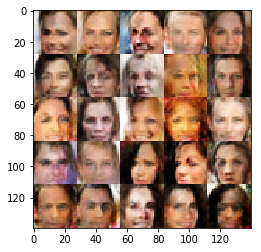

Epoch 1/1... Discriminator Loss: 0.5643... Generator Loss: 1.2004
Epoch 1/1... Discriminator Loss: 0.7104... Generator Loss: 1.1791
Epoch 1/1... Discriminator Loss: 0.5334... Generator Loss: 1.2893
Epoch 1/1... Discriminator Loss: 0.5219... Generator Loss: 1.2230
Epoch 1/1... Discriminator Loss: 1.2890... Generator Loss: 0.4297
Epoch 1/1... Discriminator Loss: 0.8893... Generator Loss: 1.0062
Epoch 1/1... Discriminator Loss: 0.6591... Generator Loss: 1.2312
Epoch 1/1... Discriminator Loss: 1.1843... Generator Loss: 0.6209
Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.4454
Epoch 1/1... Discriminator Loss: 1.2551... Generator Loss: 0.5818


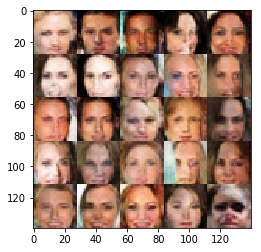

Epoch 1/1... Discriminator Loss: 0.7319... Generator Loss: 1.1546
Epoch 1/1... Discriminator Loss: 0.5691... Generator Loss: 1.2527
Epoch 1/1... Discriminator Loss: 1.0946... Generator Loss: 0.5145
Epoch 1/1... Discriminator Loss: 1.0094... Generator Loss: 0.9937
Epoch 1/1... Discriminator Loss: 0.6918... Generator Loss: 1.2207
Epoch 1/1... Discriminator Loss: 0.9321... Generator Loss: 1.0577
Epoch 1/1... Discriminator Loss: 0.9627... Generator Loss: 0.7417
Epoch 1/1... Discriminator Loss: 0.6045... Generator Loss: 1.9886
Epoch 1/1... Discriminator Loss: 1.1623... Generator Loss: 0.4974
Epoch 1/1... Discriminator Loss: 1.3039... Generator Loss: 0.8705


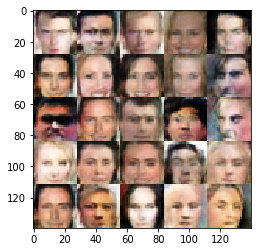

Epoch 1/1... Discriminator Loss: 0.8331... Generator Loss: 1.0109
Epoch 1/1... Discriminator Loss: 0.9477... Generator Loss: 0.6914
Epoch 1/1... Discriminator Loss: 0.9327... Generator Loss: 0.8108
Epoch 1/1... Discriminator Loss: 0.7457... Generator Loss: 1.6084
Epoch 1/1... Discriminator Loss: 0.9775... Generator Loss: 0.6992
Epoch 1/1... Discriminator Loss: 0.8402... Generator Loss: 1.2619
Epoch 1/1... Discriminator Loss: 0.7773... Generator Loss: 0.9625
Epoch 1/1... Discriminator Loss: 0.6412... Generator Loss: 1.4031
Epoch 1/1... Discriminator Loss: 1.2686... Generator Loss: 0.6640
Epoch 1/1... Discriminator Loss: 0.5465... Generator Loss: 1.2199


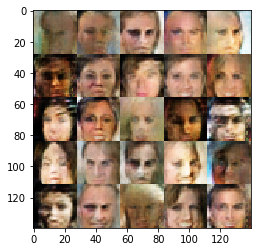

Epoch 1/1... Discriminator Loss: 1.1922... Generator Loss: 0.5357
Epoch 1/1... Discriminator Loss: 0.7789... Generator Loss: 1.2335
Epoch 1/1... Discriminator Loss: 1.2260... Generator Loss: 0.5330
Epoch 1/1... Discriminator Loss: 0.8449... Generator Loss: 0.7765
Epoch 1/1... Discriminator Loss: 0.6508... Generator Loss: 1.1301
Epoch 1/1... Discriminator Loss: 0.7986... Generator Loss: 1.1193
Epoch 1/1... Discriminator Loss: 0.4846... Generator Loss: 1.7527
Epoch 1/1... Discriminator Loss: 0.6091... Generator Loss: 1.3444
Epoch 1/1... Discriminator Loss: 0.8556... Generator Loss: 0.6471
Epoch 1/1... Discriminator Loss: 0.6801... Generator Loss: 0.9686


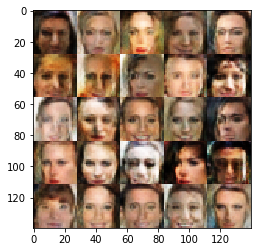

Epoch 1/1... Discriminator Loss: 0.8179... Generator Loss: 1.3024
Epoch 1/1... Discriminator Loss: 1.0156... Generator Loss: 0.9785
Epoch 1/1... Discriminator Loss: 0.8787... Generator Loss: 1.1633
Epoch 1/1... Discriminator Loss: 0.8393... Generator Loss: 0.9956
Epoch 1/1... Discriminator Loss: 1.0990... Generator Loss: 0.6325
Epoch 1/1... Discriminator Loss: 1.0608... Generator Loss: 0.6797
Epoch 1/1... Discriminator Loss: 1.0380... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.4444... Generator Loss: 0.3978
Epoch 1/1... Discriminator Loss: 1.5344... Generator Loss: 0.3223
Epoch 1/1... Discriminator Loss: 0.8099... Generator Loss: 1.2628


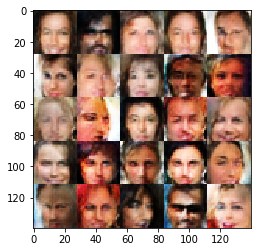

Epoch 1/1... Discriminator Loss: 1.4955... Generator Loss: 0.3360
Epoch 1/1... Discriminator Loss: 0.8251... Generator Loss: 0.9991
Epoch 1/1... Discriminator Loss: 1.3999... Generator Loss: 0.3384
Epoch 1/1... Discriminator Loss: 0.8260... Generator Loss: 0.8431
Epoch 1/1... Discriminator Loss: 1.4078... Generator Loss: 0.4882
Epoch 1/1... Discriminator Loss: 1.2214... Generator Loss: 0.5480
Epoch 1/1... Discriminator Loss: 0.3865... Generator Loss: 1.4902
Epoch 1/1... Discriminator Loss: 0.5057... Generator Loss: 1.5236
Epoch 1/1... Discriminator Loss: 0.7164... Generator Loss: 1.0471
Epoch 1/1... Discriminator Loss: 0.9079... Generator Loss: 0.7757


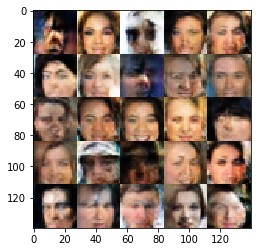

Epoch 1/1... Discriminator Loss: 0.4883... Generator Loss: 2.2775
Epoch 1/1... Discriminator Loss: 0.4312... Generator Loss: 1.6843
Epoch 1/1... Discriminator Loss: 0.9293... Generator Loss: 1.4182
Epoch 1/1... Discriminator Loss: 0.9462... Generator Loss: 0.7879
Epoch 1/1... Discriminator Loss: 1.1585... Generator Loss: 0.8479
Epoch 1/1... Discriminator Loss: 1.0738... Generator Loss: 0.6402
Epoch 1/1... Discriminator Loss: 1.0461... Generator Loss: 0.7003
Epoch 1/1... Discriminator Loss: 0.9447... Generator Loss: 0.8650
Epoch 1/1... Discriminator Loss: 0.9406... Generator Loss: 1.4265
Epoch 1/1... Discriminator Loss: 1.5683... Generator Loss: 0.3410


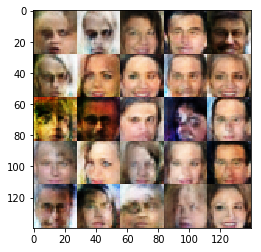

Epoch 1/1... Discriminator Loss: 0.8483... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.0855... Generator Loss: 0.5952
Epoch 1/1... Discriminator Loss: 1.1456... Generator Loss: 0.4946
Epoch 1/1... Discriminator Loss: 1.5621... Generator Loss: 0.3653
Epoch 1/1... Discriminator Loss: 1.3365... Generator Loss: 0.5135
Epoch 1/1... Discriminator Loss: 0.9733... Generator Loss: 0.7301
Epoch 1/1... Discriminator Loss: 1.1200... Generator Loss: 0.7851
Epoch 1/1... Discriminator Loss: 0.8316... Generator Loss: 0.9273
Epoch 1/1... Discriminator Loss: 0.9083... Generator Loss: 0.7376
Epoch 1/1... Discriminator Loss: 1.0095... Generator Loss: 1.0062


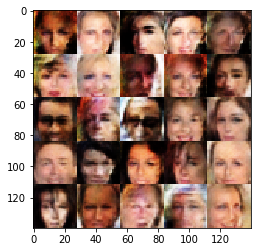

Epoch 1/1... Discriminator Loss: 1.2882... Generator Loss: 0.5090
Epoch 1/1... Discriminator Loss: 0.9067... Generator Loss: 1.3409
Epoch 1/1... Discriminator Loss: 0.7803... Generator Loss: 0.8800
Epoch 1/1... Discriminator Loss: 0.7202... Generator Loss: 1.2853
Epoch 1/1... Discriminator Loss: 1.3018... Generator Loss: 0.4258
Epoch 1/1... Discriminator Loss: 0.7565... Generator Loss: 1.0656
Epoch 1/1... Discriminator Loss: 0.7187... Generator Loss: 1.1342
Epoch 1/1... Discriminator Loss: 1.1779... Generator Loss: 1.1554
Epoch 1/1... Discriminator Loss: 0.6420... Generator Loss: 1.2393
Epoch 1/1... Discriminator Loss: 1.0688... Generator Loss: 0.8614


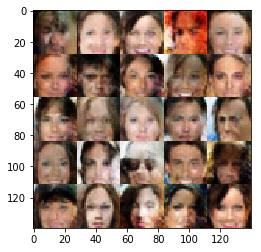

Epoch 1/1... Discriminator Loss: 0.9077... Generator Loss: 0.7284
Epoch 1/1... Discriminator Loss: 1.1234... Generator Loss: 0.7097
Epoch 1/1... Discriminator Loss: 0.9633... Generator Loss: 0.9754
Epoch 1/1... Discriminator Loss: 1.0553... Generator Loss: 1.2564
Epoch 1/1... Discriminator Loss: 1.1881... Generator Loss: 0.4841
Epoch 1/1... Discriminator Loss: 1.1236... Generator Loss: 0.5053
Epoch 1/1... Discriminator Loss: 0.6823... Generator Loss: 1.0751
Epoch 1/1... Discriminator Loss: 0.6171... Generator Loss: 1.1165
Epoch 1/1... Discriminator Loss: 1.0064... Generator Loss: 0.7539
Epoch 1/1... Discriminator Loss: 1.4567... Generator Loss: 0.4262


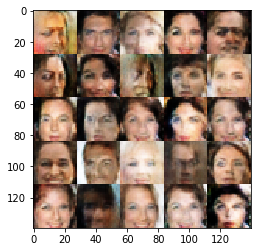

Epoch 1/1... Discriminator Loss: 0.7861... Generator Loss: 1.2104
Epoch 1/1... Discriminator Loss: 0.9878... Generator Loss: 0.6939
Epoch 1/1... Discriminator Loss: 0.9109... Generator Loss: 0.7556
Epoch 1/1... Discriminator Loss: 1.1743... Generator Loss: 0.5294
Epoch 1/1... Discriminator Loss: 1.7028... Generator Loss: 0.3576
Epoch 1/1... Discriminator Loss: 0.9176... Generator Loss: 0.7375
Epoch 1/1... Discriminator Loss: 0.7672... Generator Loss: 0.9824
Epoch 1/1... Discriminator Loss: 0.7083... Generator Loss: 1.2034
Epoch 1/1... Discriminator Loss: 0.7796... Generator Loss: 1.8453
Epoch 1/1... Discriminator Loss: 1.1382... Generator Loss: 0.5987


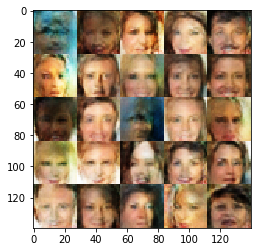

Epoch 1/1... Discriminator Loss: 0.6621... Generator Loss: 1.1014
Epoch 1/1... Discriminator Loss: 0.8755... Generator Loss: 0.8775
Epoch 1/1... Discriminator Loss: 1.3426... Generator Loss: 0.4070
Epoch 1/1... Discriminator Loss: 0.8613... Generator Loss: 0.9776
Epoch 1/1... Discriminator Loss: 0.8858... Generator Loss: 0.7269
Epoch 1/1... Discriminator Loss: 0.9303... Generator Loss: 1.0057
Epoch 1/1... Discriminator Loss: 1.1518... Generator Loss: 0.5706
Epoch 1/1... Discriminator Loss: 0.9748... Generator Loss: 0.7458
Epoch 1/1... Discriminator Loss: 0.7778... Generator Loss: 0.9153
Epoch 1/1... Discriminator Loss: 1.2856... Generator Loss: 0.4362


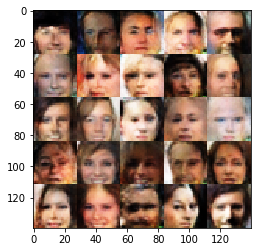

Epoch 1/1... Discriminator Loss: 0.9592... Generator Loss: 0.8064
Epoch 1/1... Discriminator Loss: 0.7630... Generator Loss: 1.0806
Epoch 1/1... Discriminator Loss: 1.1176... Generator Loss: 0.5871
Epoch 1/1... Discriminator Loss: 1.3845... Generator Loss: 0.5412
Epoch 1/1... Discriminator Loss: 0.5173... Generator Loss: 1.6047
Epoch 1/1... Discriminator Loss: 1.0651... Generator Loss: 0.7257
Epoch 1/1... Discriminator Loss: 0.7718... Generator Loss: 1.0125
Epoch 1/1... Discriminator Loss: 1.3283... Generator Loss: 0.3967
Epoch 1/1... Discriminator Loss: 1.2240... Generator Loss: 0.5026
Epoch 1/1... Discriminator Loss: 0.7445... Generator Loss: 1.0716


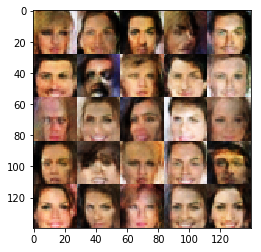

Epoch 1/1... Discriminator Loss: 1.1022... Generator Loss: 0.8236
Epoch 1/1... Discriminator Loss: 0.6952... Generator Loss: 1.1840
Epoch 1/1... Discriminator Loss: 0.7850... Generator Loss: 0.9837
Epoch 1/1... Discriminator Loss: 1.3411... Generator Loss: 0.4018
Epoch 1/1... Discriminator Loss: 0.7492... Generator Loss: 1.1332
Epoch 1/1... Discriminator Loss: 0.8287... Generator Loss: 0.8767
Epoch 1/1... Discriminator Loss: 1.0082... Generator Loss: 1.0115
Epoch 1/1... Discriminator Loss: 1.2307... Generator Loss: 0.5092
Epoch 1/1... Discriminator Loss: 0.7091... Generator Loss: 1.2650
Epoch 1/1... Discriminator Loss: 0.6751... Generator Loss: 1.2765


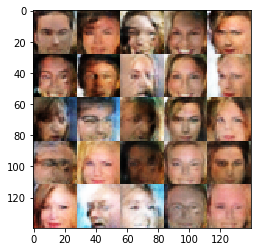

Epoch 1/1... Discriminator Loss: 1.3384... Generator Loss: 0.4569
Epoch 1/1... Discriminator Loss: 1.0625... Generator Loss: 0.7290
Epoch 1/1... Discriminator Loss: 0.7043... Generator Loss: 1.4056
Epoch 1/1... Discriminator Loss: 0.8269... Generator Loss: 0.8182
Epoch 1/1... Discriminator Loss: 0.9039... Generator Loss: 0.8872
Epoch 1/1... Discriminator Loss: 0.4157... Generator Loss: 1.7895
Epoch 1/1... Discriminator Loss: 0.7764... Generator Loss: 0.9042
Epoch 1/1... Discriminator Loss: 1.3122... Generator Loss: 0.4917
Epoch 1/1... Discriminator Loss: 1.0297... Generator Loss: 0.8305
Epoch 1/1... Discriminator Loss: 0.5825... Generator Loss: 1.4025


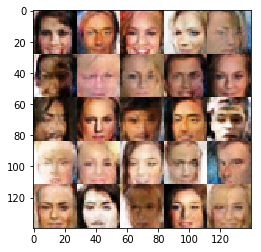

Epoch 1/1... Discriminator Loss: 0.7966... Generator Loss: 1.2118
Epoch 1/1... Discriminator Loss: 1.1170... Generator Loss: 0.8235
Epoch 1/1... Discriminator Loss: 0.3344... Generator Loss: 1.7130
Epoch 1/1... Discriminator Loss: 1.1072... Generator Loss: 0.6571
Epoch 1/1... Discriminator Loss: 1.0933... Generator Loss: 0.6484
Epoch 1/1... Discriminator Loss: 0.8004... Generator Loss: 0.9140
Epoch 1/1... Discriminator Loss: 1.1231... Generator Loss: 0.6113
Epoch 1/1... Discriminator Loss: 0.9712... Generator Loss: 0.7095
Epoch 1/1... Discriminator Loss: 1.0550... Generator Loss: 0.5567
Epoch 1/1... Discriminator Loss: 1.1952... Generator Loss: 0.5531


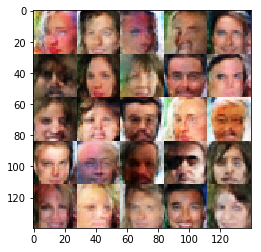

Epoch 1/1... Discriminator Loss: 0.9169... Generator Loss: 0.8248
Epoch 1/1... Discriminator Loss: 1.3192... Generator Loss: 0.4345
Epoch 1/1... Discriminator Loss: 1.0273... Generator Loss: 0.7871
Epoch 1/1... Discriminator Loss: 0.7975... Generator Loss: 1.0312
Epoch 1/1... Discriminator Loss: 1.1723... Generator Loss: 0.4561
Epoch 1/1... Discriminator Loss: 1.2997... Generator Loss: 0.4682
Epoch 1/1... Discriminator Loss: 0.8206... Generator Loss: 1.1746
Epoch 1/1... Discriminator Loss: 1.1536... Generator Loss: 0.8880
Epoch 1/1... Discriminator Loss: 0.7908... Generator Loss: 1.1618
Epoch 1/1... Discriminator Loss: 0.5882... Generator Loss: 1.2752


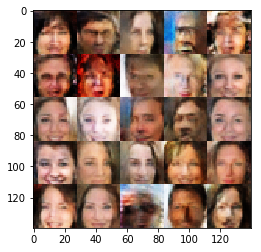

Epoch 1/1... Discriminator Loss: 0.6038... Generator Loss: 1.2847
Epoch 1/1... Discriminator Loss: 0.5570... Generator Loss: 1.5981
Epoch 1/1... Discriminator Loss: 0.9988... Generator Loss: 0.6385
Epoch 1/1... Discriminator Loss: 0.8395... Generator Loss: 0.9483
Epoch 1/1... Discriminator Loss: 0.4572... Generator Loss: 1.4586
Epoch 1/1... Discriminator Loss: 0.7694... Generator Loss: 0.9092
Epoch 1/1... Discriminator Loss: 0.5810... Generator Loss: 1.1594
Epoch 1/1... Discriminator Loss: 1.5295... Generator Loss: 0.3585
Epoch 1/1... Discriminator Loss: 0.8902... Generator Loss: 0.9264
Epoch 1/1... Discriminator Loss: 0.8131... Generator Loss: 0.8633


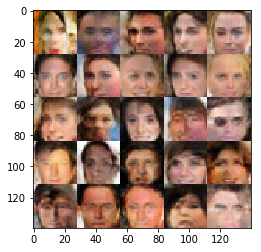

Epoch 1/1... Discriminator Loss: 0.4877... Generator Loss: 1.4215
Epoch 1/1... Discriminator Loss: 1.2741... Generator Loss: 0.8819
Epoch 1/1... Discriminator Loss: 1.0746... Generator Loss: 0.6763
Epoch 1/1... Discriminator Loss: 0.6399... Generator Loss: 0.9749
Epoch 1/1... Discriminator Loss: 0.9928... Generator Loss: 1.1476
Epoch 1/1... Discriminator Loss: 0.9377... Generator Loss: 0.7901
Epoch 1/1... Discriminator Loss: 0.5538... Generator Loss: 1.6179
Epoch 1/1... Discriminator Loss: 1.2710... Generator Loss: 0.4777
Epoch 1/1... Discriminator Loss: 1.1827... Generator Loss: 0.5512
Epoch 1/1... Discriminator Loss: 1.1160... Generator Loss: 0.6194


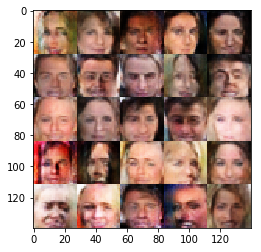

Epoch 1/1... Discriminator Loss: 0.9685... Generator Loss: 0.7893
Epoch 1/1... Discriminator Loss: 0.7549... Generator Loss: 0.8898
Epoch 1/1... Discriminator Loss: 1.3873... Generator Loss: 0.3810
Epoch 1/1... Discriminator Loss: 0.8132... Generator Loss: 1.1428
Epoch 1/1... Discriminator Loss: 0.9983... Generator Loss: 0.8652
Epoch 1/1... Discriminator Loss: 0.9824... Generator Loss: 0.8610
Epoch 1/1... Discriminator Loss: 1.4427... Generator Loss: 0.4201
Epoch 1/1... Discriminator Loss: 0.9978... Generator Loss: 0.7655
Epoch 1/1... Discriminator Loss: 0.8964... Generator Loss: 0.7201
Epoch 1/1... Discriminator Loss: 1.3090... Generator Loss: 1.0575


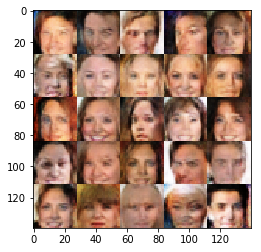

Epoch 1/1... Discriminator Loss: 1.0095... Generator Loss: 0.7090
Epoch 1/1... Discriminator Loss: 1.2488... Generator Loss: 0.5308
Epoch 1/1... Discriminator Loss: 1.3709... Generator Loss: 0.4602
Epoch 1/1... Discriminator Loss: 1.2294... Generator Loss: 0.5473
Epoch 1/1... Discriminator Loss: 0.5470... Generator Loss: 1.3032
Epoch 1/1... Discriminator Loss: 0.6858... Generator Loss: 0.9253
Epoch 1/1... Discriminator Loss: 1.0907... Generator Loss: 0.7188
Epoch 1/1... Discriminator Loss: 0.5078... Generator Loss: 1.4959
Epoch 1/1... Discriminator Loss: 0.8877... Generator Loss: 0.9030
Epoch 1/1... Discriminator Loss: 1.0416... Generator Loss: 0.7004


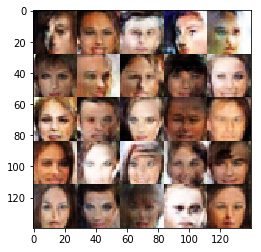

Epoch 1/1... Discriminator Loss: 0.7213... Generator Loss: 0.9627
Epoch 1/1... Discriminator Loss: 1.0007... Generator Loss: 1.0315
Epoch 1/1... Discriminator Loss: 1.4709... Generator Loss: 0.4596
Epoch 1/1... Discriminator Loss: 0.8818... Generator Loss: 0.8786
Epoch 1/1... Discriminator Loss: 1.0039... Generator Loss: 0.6998
Epoch 1/1... Discriminator Loss: 1.0470... Generator Loss: 0.8444
Epoch 1/1... Discriminator Loss: 0.8140... Generator Loss: 0.8539
Epoch 1/1... Discriminator Loss: 1.1126... Generator Loss: 0.7528
Epoch 1/1... Discriminator Loss: 0.5634... Generator Loss: 1.4301
Epoch 1/1... Discriminator Loss: 1.1154... Generator Loss: 0.6727


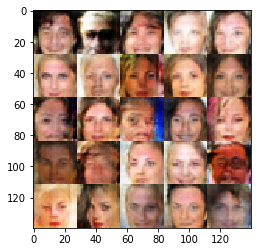

Epoch 1/1... Discriminator Loss: 0.8912... Generator Loss: 0.8990
Epoch 1/1... Discriminator Loss: 0.9104... Generator Loss: 0.7700
Epoch 1/1... Discriminator Loss: 0.9960... Generator Loss: 0.6082
Epoch 1/1... Discriminator Loss: 0.7989... Generator Loss: 1.1321
Epoch 1/1... Discriminator Loss: 1.1349... Generator Loss: 0.5403
Epoch 1/1... Discriminator Loss: 0.8887... Generator Loss: 1.1419
Epoch 1/1... Discriminator Loss: 0.9826... Generator Loss: 0.6576
Epoch 1/1... Discriminator Loss: 0.6687... Generator Loss: 1.0056
Epoch 1/1... Discriminator Loss: 1.1899... Generator Loss: 0.5914
Epoch 1/1... Discriminator Loss: 1.2269... Generator Loss: 0.4823


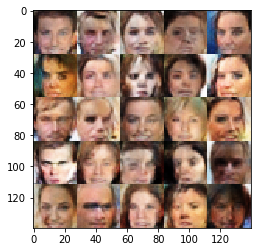

Epoch 1/1... Discriminator Loss: 0.9008... Generator Loss: 1.0316
Epoch 1/1... Discriminator Loss: 0.7347... Generator Loss: 0.9679
Epoch 1/1... Discriminator Loss: 0.5583... Generator Loss: 1.4790
Epoch 1/1... Discriminator Loss: 0.7790... Generator Loss: 1.2447
Epoch 1/1... Discriminator Loss: 0.9043... Generator Loss: 0.9398
Epoch 1/1... Discriminator Loss: 0.7785... Generator Loss: 0.9708


In [35]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.